<a id='top'></a>
# Table of Contents:
[Loading Capital Bikeshare Data](#capitalbikeshare)  
[Loading Live XML Feed Data](#xmlfeed)  
[Combine Capital Bikeshare and Live XML](#combine)  
[Explore the Capital Bikeshare and Live XML Combined Dataset](#explore1)  
[Loading CaBi Tracker Data](#cabitracker)  
[Create Full Baseline Dataset](#fullbaseline)  
[General Data Exploration for Full Baseline](#explore2)  
[Specific Data Exploration for Full Baseline for Station 31116](#specificbaseline)  
[Specific Forecast for Station 31116](#specificforecast)  
[Other Methods for Station 31116](#othermethods)  
[General Forecast for All Stations](#generalforecast)

In [1]:
import os
import re
import pandas as pd
import numpy as np
import urllib.request
import shutil
import xml.etree.ElementTree as ET
import matplotlib
import matplotlib.pyplot as plt
import pylab as pl
from dateutil.relativedelta import relativedelta
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import datetime
from sklearn.metrics import mean_squared_error
import matplotlib.dates as md

sns.set_style("whitegrid")
%matplotlib inline
pd.options.mode.chained_assignment = None

<a id='capitalbikeshare'></a>
# Load in Capital Bikeshare's Historical Trip Pattern Data
[Back to Top](#top)

To begin, I will read in the most recent, historical year of data available from Capital Bikeshare. This ranges from 2015 Q3 to 2016 Q3. Each file is stored as a separate dataframe so that I can explore each one individually before combining them into one dataframe.

In [2]:
df_2015Q3 = pd.read_csv('data/2015-Q3-cabi-trip-history-data.csv')
df_2015Q4 = pd.read_csv('data/2015-Q4-Trips-History-Data.csv')
df_2016Q1 = pd.read_csv('data/2016-Q1-Trips-History-Data.csv')
df_2016Q2 = pd.read_csv('data/2016-Q2-Trips-History-Data.csv')
df_2016Q3_1 = pd.read_csv('data/2016-Q3-Trips-History-Data-1.csv')
df_2016Q3_2 = pd.read_csv('data/2016-Q3-Trips-History-Data-2.csv')

Below I explore each dataframe so that I can determine whether or not they will combine easily.

In [3]:
df_2015Q3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1056366 entries, 0 to 1056365
Data columns (total 9 columns):
Duration (ms)           1056366 non-null int64
Start date              1056366 non-null object
End date                1056366 non-null object
Start station number    1056366 non-null int64
Start station           1056366 non-null object
End station number      1056366 non-null int64
End station             1056366 non-null object
Bike #                  1056366 non-null object
Member type             1056366 non-null object
dtypes: int64(3), object(6)
memory usage: 72.5+ MB


In [4]:
df_2015Q4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 706004 entries, 0 to 706003
Data columns (total 9 columns):
Duration (ms)           706004 non-null int64
Start date              706004 non-null object
End date                706004 non-null object
Start station number    706004 non-null int64
Start station           706004 non-null object
End station number      706004 non-null int64
End station             706004 non-null object
Bike #                  706004 non-null object
Member type             706004 non-null object
dtypes: int64(3), object(6)
memory usage: 48.5+ MB


In [5]:
df_2016Q1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 552399 entries, 0 to 552398
Data columns (total 9 columns):
Duration (ms)           552399 non-null int64
Start date              552399 non-null object
End date                552399 non-null object
Start station number    552399 non-null int64
Start station           552399 non-null object
End station number      552399 non-null int64
End station             552399 non-null object
Bike number             552399 non-null object
Member Type             552399 non-null object
dtypes: int64(3), object(6)
memory usage: 37.9+ MB


In [6]:
df_2016Q2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 942332 entries, 0 to 942331
Data columns (total 9 columns):
Duration (ms)           942332 non-null int64
Start date              942332 non-null object
End date                942332 non-null object
Start station number    942332 non-null int64
Start station           942332 non-null object
End station number      942332 non-null int64
End station             942332 non-null object
Bike number             942332 non-null object
Account type            942332 non-null object
dtypes: int64(3), object(6)
memory usage: 64.7+ MB


In [7]:
df_2016Q3_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 723741 entries, 0 to 723740
Data columns (total 9 columns):
Duration (ms)           723741 non-null int64
Start date              723741 non-null object
End date                723741 non-null object
Start station number    723741 non-null int64
Start station           723741 non-null object
End station number      723741 non-null int64
End station             723741 non-null object
Bike number             723741 non-null object
Member Type             723741 non-null object
dtypes: int64(3), object(6)
memory usage: 49.7+ MB


In [8]:
df_2016Q3_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344246 entries, 0 to 344245
Data columns (total 9 columns):
Duration (ms)           344246 non-null int64
Start date              344246 non-null object
End date                344246 non-null object
Start station number    344246 non-null int64
Start station           344246 non-null object
End station number      344246 non-null int64
End station             344246 non-null object
Bike number             344246 non-null object
Member Type             344246 non-null object
dtypes: int64(3), object(6)
memory usage: 23.6+ MB


Since all dataframes seem to have similar information and data types, and have been created under the same standards through Capital Bikeshare, I will go ahead and standardize each dataframe's feature names. I will then combine all dataframes into one.

In [9]:
new_feature_names = ['Duration', 'Start_Date', 'End_Date', 'Start_Station_Number', 
                     'Start_Station', 'End_Station_Number', 'End_Station', 'Bike_Number', 'Member_Type']

df_2015Q3.columns = new_feature_names
df_2015Q4.columns = new_feature_names
df_2016Q1.columns = new_feature_names
df_2016Q2.columns = new_feature_names
df_2016Q3_1.columns = new_feature_names
df_2016Q3_2.columns = new_feature_names

bike_data = df_2015Q3.append([df_2015Q4, df_2016Q1, df_2016Q2, df_2016Q3_1, df_2016Q3_2])
bike_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4325088 entries, 0 to 344245
Data columns (total 9 columns):
Duration                int64
Start_Date              object
End_Date                object
Start_Station_Number    int64
Start_Station           object
End_Station_Number      int64
End_Station             object
Bike_Number             object
Member_Type             object
dtypes: int64(3), object(6)
memory usage: 330.0+ MB


In [10]:
# Explore the first several rows of the new dataframe
bike_data.head()

,Duration,Start_Date,End_Date,Start_Station_Number,Start_Station,End_Station_Number,End_Station,Bike_Number,Member_Type
0,257866,7/1/2015 0:00,7/1/2015 0:04,31116,California St & Florida Ave NW,31117,15th & Euclid St NW,W21516,Registered
1,2683934,7/1/2015 0:00,7/1/2015 0:45,31247,Jefferson Dr & 14th St SW,31247,Jefferson Dr & 14th St SW,W00476,Casual
2,2349547,7/1/2015 0:02,7/1/2015 0:41,31247,Jefferson Dr & 14th St SW,31247,Jefferson Dr & 14th St SW,W20384,Casual
3,826571,7/1/2015 0:02,7/1/2015 0:16,31229,New Hampshire Ave & T St NW,31602,Park Rd & Holmead Pl NW,W00972,Registered
4,123046,7/1/2015 0:04,7/1/2015 0:06,31610,Eastern Market / 7th & North Carolina Ave SE,31269,3rd St & Pennsylvania Ave SE,W21565,Registered


<a id='xmlfeed'></a>
# Load in a snapshot of Capital Bikeshare's Live XML Feed
Next, I will take a snapshot of the current state of Capital Bikeshare's stations through the Live XML Feed. I will need the latitude and longitude for visualization purposes, and I will need the station capacity for analysis later:  
[Back to Top](#top)

In [11]:
# The code in this cell is from the page [https://kwkelly.com/blog/analyzing-capital-bikeshare-data-with-python-and-pandas/]

# Access the XML feed and download to a file
#def get_station_xml():
#    url = "https://www.capitalbikeshare.com/data/stations/bikeStations.xml"
#    download_dir = 'xml_data'
#    if not os.path.exists(download_dir):
#        os.mkdir(download_dir)
#    file_name = os.path.join(download_dir, 'bike_stations.xml')
#    with urllib.request.urlopen(url) as response, open(file_name, 'wb') as out_file:
#        shutil.copyfileobj(response, out_file)
#get_station_xml()

# Parse the XML file and return a dataframe object
def xml_to_pandas(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    l = []
    for station in root:
        d = {}
        for attrib in station:
            d[str(attrib.tag)] = str(attrib.text)
        l.append(d)

    df = pd.DataFrame.from_dict(l)
    return df 
bike_stations = xml_to_pandas('xml_data/bike_stations.xml')

 
# Wrangle the resulting dataframe object and display
bike_stations['terminalName'] = bike_stations['terminalName'].astype(int)
bike_stations['lat'] = bike_stations['lat'].astype(float)
bike_stations['long'] = bike_stations['long'].astype(float)
station_locations = bike_stations[['terminalName']]
station_locations['location'] = list(zip(bike_stations['lat'], bike_stations['long']))
station_locations['Station_Capacity'] = (bike_stations['nbBikes'].astype(int) 
                                         + bike_stations['nbEmptyDocks'].astype(int))
station_locations.head()

,terminalName,location,Station_Capacity
0,31000,"(38.858971, -77.05323)",14
1,31001,"(38.85725, -77.05332)",11
2,31002,"(38.856425, -77.049232)",15
3,31003,"(38.86017, -77.049593)",11
4,31004,"(38.857866, -77.05949)",11


<a id='combine'></a>
# Combine the two datasets:
1) Capital Bikeshare's Historical Trip Data stored in bike_data  
2) Capital Bikeshare's Live XML Feed stored in station_locations  
[Back to Top](#top)

In [12]:
# Combine original dataframe with new station lat/long data using a left join on End Station and then Start Station
station_locations.columns = ['End_Station_Number', 'End_Location', 'End_Station_Capacity']
bike_data = pd.merge(bike_data, station_locations, how='left', on='End_Station_Number')

station_locations.columns = ['Start_Station_Number', 'Start_Location', 'Start_Station_Capacity']
bike_data = pd.merge(bike_data, station_locations, how='left', on='Start_Station_Number')

# Display the first several rows of the new dataframe
bike_data.head()

,Duration,Start_Date,End_Date,Start_Station_Number,Start_Station,End_Station_Number,End_Station,Bike_Number,Member_Type,End_Location,End_Station_Capacity,Start_Location,Start_Station_Capacity
0,257866,7/1/2015 0:00,7/1/2015 0:04,31116,California St & Florida Ave NW,31117,15th & Euclid St NW,W21516,Registered,"(38.92333, -77.0352)",15.0,"(38.917761, -77.04062)",19.0
1,2683934,7/1/2015 0:00,7/1/2015 0:45,31247,Jefferson Dr & 14th St SW,31247,Jefferson Dr & 14th St SW,W00476,Casual,"(38.888553, -77.032429)",21.0,"(38.888553, -77.032429)",21.0
2,2349547,7/1/2015 0:02,7/1/2015 0:41,31247,Jefferson Dr & 14th St SW,31247,Jefferson Dr & 14th St SW,W20384,Casual,"(38.888553, -77.032429)",21.0,"(38.888553, -77.032429)",21.0
3,826571,7/1/2015 0:02,7/1/2015 0:16,31229,New Hampshire Ave & T St NW,31602,Park Rd & Holmead Pl NW,W00972,Registered,"(38.9308, -77.0315)",19.0,"(38.91554, -77.03818)",23.0
4,123046,7/1/2015 0:04,7/1/2015 0:06,31610,Eastern Market / 7th & North Carolina Ave SE,31269,3rd St & Pennsylvania Ave SE,W21565,Registered,"(38.887378, -77.001955)",14.0,"(38.886952, -76.996806)",14.0


<a id='explore1'></a>
# Explore the new, combined dataframe for inconsistencies:
[Back to Top](#top)

In [13]:
# Determine whether there are any missing values
print('Missing values:')
for feature in bike_data.columns:
    print(feature + ':', bike_data[feature].isnull().values.ravel().sum())

Missing values:
Duration: 0
Start_Date: 0
End_Date: 0
Start_Station_Number: 0
Start_Station: 0
End_Station_Number: 0
End_Station: 0
Bike_Number: 0
Member_Type: 0
End_Location: 76
End_Station_Capacity: 76
Start_Location: 87
Start_Station_Capacity: 87


Seeing as the newly formed features, Start_Location, End_Location, Start_Station_Capacity, and End_Station_Capacity contain missing values I need to determine which stations are missing entries, and why this might be the case.

In [14]:
# Print out unique station numbers to check which stations do not have associated locations or capacities  
start_subset_test = bike_data[bike_data['Start_Location'].isnull()]
print('Start Stations without locations:', start_subset_test['Start_Station_Number'].unique())
start_subset_test = bike_data[bike_data['Start_Station_Capacity'].isnull()]
print('Start Stations without capacities:', start_subset_test['Start_Station_Number'].unique())

end_subset_test = bike_data[bike_data['End_Location'].isnull()]
print('End Stations without locations:', end_subset_test['End_Station_Number'].unique())
end_subset_test = bike_data[bike_data['End_Station_Capacity'].isnull()]
print('End Stations without capacities:', end_subset_test['End_Station_Number'].unique())

Start Stations without locations: [31709]
Start Stations without capacities: [31709]
End Stations without locations: [31709]
End Stations without capacities: [31709]


It is now more clear that station 31709 is the only station that is missing coordinate and capacity data as found using the live XML feed. Doing some research has shown me that it is possible that this station is no longer in service because it is probably an old station that was phased out. I was able to find the coordinates of (38.884085, -76.957461) and capacity of 11 (https://gist.github.com/since1968/e51c0f3d95e67bf49f74). The live XML feed was not able to give me this data because it is a point in time feed whereas the data I am using is from 2015 Q3 - 2016 Q3. I will now add these values to the dataframe.

In [15]:
location_31709 = '(38.884085, -76.957461)'
capacity_31709 = 11
bike_data.loc[bike_data['Start_Station_Number'] == 31709, 'Start_Location'] = location_31709
bike_data.loc[bike_data['Start_Station_Number'] == 31709, 'Start_Station_Capacity'] = capacity_31709
bike_data.loc[bike_data['End_Station_Number'] == 31709, 'End_Location'] = location_31709
bike_data.loc[bike_data['End_Station_Number'] == 31709, 'End_Station_Capacity'] = capacity_31709

# Are the missing values gone?
print('Missing Start Station Location:', bike_data['Start_Location'].isnull().values.ravel().sum())
print('Missing Start Station Capacity:', bike_data['Start_Station_Capacity'].isnull().values.ravel().sum())
print('Missing End Station Location:', bike_data['End_Location'].isnull().values.ravel().sum())
print('Missing End Station Capacity:', bike_data['End_Station_Capacity'].isnull().values.ravel().sum())

Missing Start Station Location: 0
Missing Start Station Capacity: 0
Missing End Station Location: 0
Missing End Station Capacity: 0


In [16]:
# Determine how many different values each feature can take
print('Number of unique values:')
for feature in bike_data.columns:
    print(feature + ':', len(list(bike_data[feature].unique())))

Number of unique values:
Duration: 1828278
Start_Date: 521665
End_Date: 521874
Start_Station_Number: 407
Start_Station: 415
End_Station_Number: 407
End_Station: 415
Bike_Number: 4364
Member_Type: 2
End_Location: 407
End_Station_Capacity: 28
Start_Location: 407
Start_Station_Capacity: 28


As we can see above, some features have an appropriate number of values while others do not. Duration, Start_Date, End_Date, and Member_Type are as expected. Per Capital Bikeshare's website, there are over 3,700 bikes available at over 440 stations. Given this information, the number of unique Bike_Number's may be too high, but this could be a function of changing bike numbers over the course of the year. Lastly, it is odd that Start_Station_Number, Start_Location, End_Station_Number, and End_Location have 407 values while Start_Station and End_Station have 415 values. Since I would have expected these features to match, I will explore and clean further below.

In [17]:
# Split the original data into a dataframe that shows only the start station information
start_df = pd.DataFrame(bike_data['Start_Station'].value_counts())
start_df.reset_index(drop=False, inplace=True)
start_df.columns = ['Start_Station', 'Counts']
start_df = start_df.merge(bike_data[['Start_Location', 'Start_Station_Number', 'Start_Station']], how='left', on='Start_Station')
start_df.drop_duplicates(inplace=True)
start_df['Start_Location_Lat'] = start_df['Start_Location'].map(lambda x: str(x).split(', ')[0].lstrip('('))
start_df['Start_Location_Long'] = start_df['Start_Location'].map(lambda x: str(x).split(', ')[1].rstrip(')'))
start_df.drop('Start_Location', axis=1, inplace=True)
start_df = start_df.sort_values(by='Start_Station_Number')
start_df.reset_index(drop=True, inplace=True)

start_df.head()

,Start_Station,Counts,Start_Station_Number,Start_Location_Lat,Start_Location_Long
0,20th & Bell St,1371,31000,38.858970999999997,-77.053229999999999
1,Eads St & 15th St S,1298,31000,38.858970999999997,-77.053229999999999
2,18th & Eads St.,3370,31001,38.857250000000001,-77.053319999999999
3,20th & Crystal Dr,7792,31002,38.856425000000002,-77.049232000000003
4,15th & Crystal Dr,7359,31003,38.860169999999997,-77.049593000000002


In [18]:
# Split the original data into a dataframe that shows only the end station information
end_df = pd.DataFrame(bike_data['End_Station'].value_counts())
end_df.reset_index(drop=False, inplace=True)
end_df.columns = ['End_Station', 'Counts']
end_df = end_df.merge(bike_data[['End_Location', 'End_Station_Number', 'End_Station']], how='left', on='End_Station')
end_df.drop_duplicates(inplace=True)
end_df['End_Location_Lat'] = end_df['End_Location'].map(lambda x: str(x).split(', ')[0].lstrip('('))
end_df['End_Location_Long'] = end_df['End_Location'].map(lambda x: str(x).split(', ')[1].rstrip(')'))
end_df.drop('End_Location', axis=1, inplace=True)
end_df = end_df.sort_values(by='End_Station_Number')
end_df.reset_index(drop=True, inplace=True)

end_df.head()

,End_Station,Counts,End_Station_Number,End_Location_Lat,End_Location_Long
0,Eads St & 15th St S,1352,31000,38.858970999999997,-77.053229999999999
1,20th & Bell St,837,31000,38.858970999999997,-77.053229999999999
2,18th & Eads St.,3205,31001,38.857250000000001,-77.053319999999999
3,20th & Crystal Dr,8797,31002,38.856425000000002,-77.049232000000003
4,15th & Crystal Dr,7495,31003,38.860169999999997,-77.049593000000002


In [19]:
# Print out descriptive stats to check if the same problems persist
print('Unique Start Station Lat/Long:', len(list(bike_data['Start_Location'].unique())))
print('Unique Start Station Numbers:', len(list(start_df['Start_Station_Number'].unique())))
print('Unique Start Station Names:', len(list(start_df['Start_Station'].unique())))
print('Unique End Station Lat/Long:', len(list(bike_data['End_Location'].unique())))
print('Unique End Station Numbers:', len(list(end_df['End_Station_Number'].unique())))
print('Unique End Station Names:', len(list(end_df['End_Station'].unique())))

Unique Start Station Lat/Long: 407
Unique Start Station Numbers: 407
Unique Start Station Names: 415
Unique End Station Lat/Long: 407
Unique End Station Numbers: 407
Unique End Station Names: 415


In [20]:
# Determine where exactly there are issues in the start dataframe
for row in start_df.itertuples():
    try:
        if start_df.get_value(row[0], 'Start_Station_Number') == start_df.get_value(row[0]-1, 'Start_Station_Number'):
            print('Start_Station_Number:', start_df.get_value(row[0]-1, 'Start_Station_Number'), 
                  '\nStart_Station Name:', start_df.get_value(row[0]-1, 'Start_Station'), 
                  '\nName Count:', start_df.get_value(row[0]-1, 'Counts'),
                  'Lat:', start_df.get_value(row[0]-1, 'Start_Location_Lat'),
                  'Long:', start_df.get_value(row[0]-1, 'Start_Location_Long'))
            print('Start_Station_Number:', start_df.get_value(row[0], 'Start_Station_Number'), 
                  '\nStart_Station Name:', start_df.get_value(row[0], 'Start_Station'), 
                  '\nName Count:', start_df.get_value(row[0], 'Counts'),
                  'Lat:', start_df.get_value(row[0], 'Start_Location_Lat'),
                  'Long:', start_df.get_value(row[0], 'Start_Location_Long'), end='\n\n')
    except:
        pass

Start_Station_Number: 31000 
Start_Station Name: 20th & Bell St 
Name Count: 1371 Lat: 38.858970999999997 Long: -77.053229999999999
Start_Station_Number: 31000 
Start_Station Name: Eads St & 15th St S 
Name Count: 1298 Lat: 38.858970999999997 Long: -77.053229999999999

Start_Station_Number: 31030 
Start_Station Name: N Adams St & Lee Hwy 
Name Count: 1648 Lat: 38.89593 Long: -77.089005999999998
Start_Station_Number: 31030 
Start_Station Name: Lee Hwy & N Adams St 
Name Count: 4621 Lat: 38.89593 Long: -77.089005999999998

Start_Station_Number: 31039 
Start_Station Name: Wilson Blvd & N Quincy St 
Name Count: 1527 Lat: 38.880012000000001 Long: -77.107854000000003
Start_Station_Number: 31039 
Start_Station Name: N Quincy St & Wilson Blvd 
Name Count: 4791 Lat: 38.880012000000001 Long: -77.107854000000003

Start_Station_Number: 31048 
Start_Station Name: King St Metro South 
Name Count: 4361 Lat: 38.805767000000003 Long: -77.060720000000003
Start_Station_Number: 31048 
Start_Station Name: 

In [21]:
# Determine where exactly there are issues in the end dataframe
for row in end_df.itertuples():
    try:
        if end_df.get_value(row[0], 'End_Station_Number') == end_df.get_value(row[0]-1, 'End_Station_Number'):
            print('End_Station_Number:', end_df.get_value(row[0]-1, 'End_Station_Number'), 
                  '\nEnd_Station Name:', end_df.get_value(row[0]-1, 'End_Station'), 
                  '\nName Count:', end_df.get_value(row[0]-1, 'Counts'),
                  'Lat:', end_df.get_value(row[0]-1, 'End_Location_Lat'),
                  'Long:', end_df.get_value(row[0]-1, 'End_Location_Long'))
            print('End_Station_Number:', end_df.get_value(row[0], 'End_Station_Number'), 
                  '\nEnd_Station Name:', end_df.get_value(row[0], 'End_Station'), 
                  '\nName Count:', end_df.get_value(row[0], 'Counts'),
                  'Lat:', end_df.get_value(row[0], 'End_Location_Lat'),
                  'Long:', end_df.get_value(row[0], 'End_Location_Long'), end='\n\n')
    except:
        pass

End_Station_Number: 31000 
End_Station Name: Eads St & 15th St S 
Name Count: 1352 Lat: 38.858970999999997 Long: -77.053229999999999
End_Station_Number: 31000 
End_Station Name: 20th & Bell St 
Name Count: 837 Lat: 38.858970999999997 Long: -77.053229999999999

End_Station_Number: 31030 
End_Station Name: Lee Hwy & N Adams St 
Name Count: 2741 Lat: 38.89593 Long: -77.089005999999998
End_Station_Number: 31030 
End_Station Name: N Adams St & Lee Hwy 
Name Count: 1215 Lat: 38.89593 Long: -77.089005999999998

End_Station_Number: 31039 
End_Station Name: N Quincy St & Wilson Blvd 
Name Count: 4315 Lat: 38.880012000000001 Long: -77.107854000000003
End_Station_Number: 31039 
End_Station Name: Wilson Blvd & N Quincy St 
Name Count: 1363 Lat: 38.880012000000001 Long: -77.107854000000003

End_Station_Number: 31048 
End_Station Name: King St Metro 
Name Count: 1746 Lat: 38.805767000000003 Long: -77.060720000000003
End_Station_Number: 31048 
End_Station Name: King St Metro South 
Name Count: 3186 L

It is clear that, when taking into account both start and end station numbers, the same station numbers and lat/long pairs appear to be repeated. Each station number and lat/long pair above is related to two (in one case three) different station names. Further, the station name counts are not repeated, which indicates that the station numbers are not duplicated, but the station names have been changing over time. For this reason, and because this is a unique identifier that is not predictive, I will drop the Start_Station and End_Station features from the data set.

In [22]:
bike_data.drop(['Start_Station', 'End_Station'], 
                axis=1, inplace=True)

bike_data.head()

,Duration,Start_Date,End_Date,Start_Station_Number,End_Station_Number,Bike_Number,Member_Type,End_Location,End_Station_Capacity,Start_Location,Start_Station_Capacity
0,257866,7/1/2015 0:00,7/1/2015 0:04,31116,31117,W21516,Registered,"(38.92333, -77.0352)",15.0,"(38.917761, -77.04062)",19.0
1,2683934,7/1/2015 0:00,7/1/2015 0:45,31247,31247,W00476,Casual,"(38.888553, -77.032429)",21.0,"(38.888553, -77.032429)",21.0
2,2349547,7/1/2015 0:02,7/1/2015 0:41,31247,31247,W20384,Casual,"(38.888553, -77.032429)",21.0,"(38.888553, -77.032429)",21.0
3,826571,7/1/2015 0:02,7/1/2015 0:16,31229,31602,W00972,Registered,"(38.9308, -77.0315)",19.0,"(38.91554, -77.03818)",23.0
4,123046,7/1/2015 0:04,7/1/2015 0:06,31610,31269,W21565,Registered,"(38.887378, -77.001955)",14.0,"(38.886952, -76.996806)",14.0


To help visualize the popularity of certain stations and trips between all stations, I have further wrangled the data off to the side. The resulting visualizations can be found here:  
• Starting Station Popularity Bubble Map:   https://public.tableau.com/profile/dpalbrecht#!/vizhome/CapitalBikeshareStartingStationPopularityBubbleMap2015Q3-2016Q3/Sheet2  
• Total Trip Popularity Spider Map:  
https://public.tableau.com/profile/dpalbrecht#!/vizhome/CapitalBikeshareTotalTripPopularitySpiderMap2015Q3-2016Q3/Sheet1

<a id='cabitracker'></a>
# Load CaBi Tracker's Historical System Outage Data
[Back to Top](#top)

In [23]:
# Read in CaBi Tracker data
outage_data = pd.read_csv('outage/status_07012015_08312015.csv')

# Display outage data
outage_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75219 entries, 0 to 75218
Data columns (total 6 columns):
Terminal Number    75219 non-null int64
Station Name       75219 non-null object
Status             75219 non-null object
Start              75219 non-null object
End                75219 non-null object
Duration           75219 non-null int64
dtypes: int64(2), object(4)
memory usage: 3.4+ MB


In [24]:
# Rename column names
outage_data.columns = ['Station_Number', 'Station_Name',
                      'Status', 'Start', 'End', 'Duration']
outage_data['Start'] = pd.to_datetime(outage_data['Start'], infer_datetime_format=True)
outage_data['End'] = pd.to_datetime(outage_data['End'], infer_datetime_format=True)

# Display the first 5 rows of outage data
outage_data.head()

,Station_Number,Station_Name,Status,Start,End,Duration
0,31631,8th & F St NE,full,2015-08-31 21:02:13,2015-08-31 23:59:34,177
1,31252,21st St & Pennsylvania Ave NW,empty,2015-08-31 21:45:48,2015-08-31 23:58:34,133
2,31247,Jefferson Dr & 14th St SW,empty,2015-08-31 23:55:31,2015-08-31 23:56:32,1
3,31119,14th & Belmont St NW,full,2015-08-31 21:56:58,2015-08-31 23:54:31,118
4,31221,18th & M St NW,empty,2015-08-31 22:19:15,2015-08-31 23:53:30,94


In [25]:
# Take only the first outage notification for each station
outage_data_reduced = pd.DataFrame()
no_outage_list = []
for station in list(bike_data['Start_Station_Number'].unique()): 
    temp_df = outage_data[outage_data['Station_Number'] == station].sort_values(by='Start')
    try:
        outage_data_reduced = outage_data_reduced.append(temp_df.iloc[0])
    except:
        no_outage_list.append(station)
    
print('There is no outage data for {} stations.'.format(len(no_outage_list)))
outage_data_reduced.head()

There is no outage data for 77 stations.


,Duration,End,Start,Station_Name,Station_Number,Status
75075,5.0,2015-07-01 08:25:38,2015-07-01 08:20:33,California St & Florida Ave NW,31116.0,empty
74861,1.0,2015-07-01 10:52:37,2015-07-01 10:51:36,Jefferson Dr & 14th St SW,31247.0,full
75127,9.0,2015-07-01 07:45:04,2015-07-01 07:35:57,New Hampshire Ave & T St NW,31229.0,empty
75016,20.0,2015-07-01 09:02:07,2015-07-01 08:41:50,Eastern Market / 7th & North Carolina Ave SE,31610.0,empty
75201,5.0,2015-07-01 00:48:20,2015-07-01 00:43:16,Lincoln Memorial,31258.0,empty


Since there are stations with no outage data, I need to take these stations out of the bike_data dataframe for two reasons:  
1) I won't be able to accurately determine how many bikes to start with at these stations at time 0  
2) Since these stations do not have any empty/full notifications, they likely do not need rebalancing

In [26]:
# Sanity check before taking stations out
print('{} start stations; {} end stations'.format(len(list(bike_data['Start_Station_Number'].unique())), 
                                                  len(list(bike_data['End_Station_Number'].unique()))))

407 start stations; 407 end stations


In [27]:
# Take out stations that do not have any empty or full notifications
bike_data = bike_data[np.logical_not(bike_data['Start_Station_Number'].isin(no_outage_list))]
bike_data = bike_data[np.logical_not(bike_data['End_Station_Number'].isin(no_outage_list))]

# Take out unecessary features from bike_data and prepare to split
bike_data.drop(['Duration', 'Bike_Number', 'Member_Type', 'Start_Location', 
                'End_Location'], axis=1, inplace=True)
bike_data['Status'] = np.nan
bike_data['Start_Date'] = pd.to_datetime(bike_data['Start_Date'], infer_datetime_format=True)
bike_data['End_Date'] = pd.to_datetime(bike_data['End_Date'], infer_datetime_format=True)

# Display
bike_data.head()

,Start_Date,End_Date,Start_Station_Number,End_Station_Number,End_Station_Capacity,Start_Station_Capacity,Status
0,2015-07-01 00:00:00,2015-07-01 00:04:00,31116,31117,15.0,19.0,NaN
1,2015-07-01 00:00:00,2015-07-01 00:45:00,31247,31247,21.0,21.0,NaN
2,2015-07-01 00:02:00,2015-07-01 00:41:00,31247,31247,21.0,21.0,NaN
3,2015-07-01 00:02:00,2015-07-01 00:16:00,31229,31602,19.0,23.0,NaN
4,2015-07-01 00:04:00,2015-07-01 00:06:00,31610,31269,14.0,14.0,NaN


In [28]:
# Sanity check after taking stations out
print('{} start stations; {} end stations'.format(len(list(bike_data['Start_Station_Number'].unique())), 
                                                  len(list(bike_data['End_Station_Number'].unique()))))

330 start stations; 330 end stations


<a id='fullbaseline'></a>
# Create a baseline for the final, combined dataframe and create target variables
Here I will create two target variables: 1) The number of bikes at a station and 2) the percent capacity at a station. The data I have been wrangling above, in bike_data, is historical trip data, so it is only part of what is needed to back out bikes and percent capacity at each station. I will bring in the second part of the needed data from CaBi Tracker, which shows the points in time that any station starts an empty cycle, ends an empty cycle, starts a full cycle, and ends a full cycle. Merging these two data sets together should guide me in determining the flow of bikes between stations.  
[Back to Top](#top)

In [29]:
discrete_bike_data = pd.DataFrame()

for station in list(bike_data['Start_Station_Number'].unique()): 
    
    # Select subsets of the bike_data and outage_data dataframes
    bike_data_subset = bike_data[(bike_data['Start_Station_Number'] == station) | (bike_data['End_Station_Number'] == station)]
    outage_data_subset = outage_data_reduced[outage_data_reduced['Station_Number'] == station]
    
    # Split bike_data_subset into a start station dataframe that matches the station
    # The resulting dataframe only includes a 'start date' and an action to subtract a bike
    bike_data_subset_start = bike_data_subset[bike_data_subset['Start_Station_Number'] == station]
    bike_data_subset_start.drop(['End_Date', 'Start_Station_Number', 
                                 'End_Station_Number', 'End_Station_Capacity'], axis=1, inplace=True)
    bike_data_subset_start['Status'] = 'subtract bike'
    bike_data_subset_start.set_index('Start_Date', drop=False, inplace=True)

    # Split bike_data_subset into a end station dataframe that matches the station
    # The resulting dataframe only includes a 'start date' and an action to add a bike
    bike_data_subset_end = bike_data_subset[bike_data_subset['End_Station_Number'] == station]
    bike_data_subset_end.drop(['Start_Date', 'Start_Station_Number', 
                               'End_Station_Number', 'Start_Station_Capacity'], axis=1, inplace=True)
    bike_data_subset_end.columns = ['Start_Date', 'Start_Station_Capacity', 'Status']
    bike_data_subset_end['Status'] = 'add bike'
    bike_data_subset_end.set_index('Start_Date', drop=False, inplace=True)
    
    if outage_data_subset.iloc[0].loc['Status'] == 'empty':
        # Split outage_data_subset for when an empty notification starts
        outage_data_subset_status = outage_data_subset.drop(['End', 'Station_Name', 'Duration'], axis=1)
        outage_data_subset_status = outage_data_subset_status[outage_data_subset_status['Status'] == 'empty']
        outage_data_subset_status['Status'] = 'empty'
        outage_data_subset_status.columns = ['Start_Date', 'Station_Number', 'Status']
        outage_data_subset_status['Start_Station_Capacity'] = bike_data_subset_start['Start_Station_Capacity'].iloc[0]
        outage_data_subset_status.set_index('Start_Date', drop=False, inplace=True)

    else:
        # Split outage_data_subset for when a full notification starts
        outage_data_subset_status = outage_data_subset.drop(['End', 'Station_Name', 'Duration'], axis=1)
        outage_data_subset_status = outage_data_subset_status[outage_data_subset_status['Status'] == 'full']
        outage_data_subset_status['Status'] = 'full'
        outage_data_subset_status.columns = ['Start_Date', 'Station_Number', 'Status']
        outage_data_subset_status['Start_Station_Capacity'] = bike_data_subset_start['Start_Station_Capacity'].iloc[0]
        outage_data_subset_status.set_index('Start_Date', drop=False, inplace=True)

    # Combine the discretized dataframes
    combined_subset = bike_data_subset_start.append([bike_data_subset_end, outage_data_subset_status])

    # Prepare the combined dataframe for iteration
    combined_subset['Bike_Count'] = 0
    combined_subset['Station_Number'] = station
    combined_subset.columns = ['Date', 'Start_Station_Capacity', 'Station_Number', 'Status', 'Bike_Count']
    combined_subset.sort_values(by='Date', ascending=True, inplace=True)
    combined_subset.reset_index(drop=True, inplace=True)
    
    # Iterate over the rows in combined_subset and fill in Bike_Count 
    cut = 1
    for row in combined_subset.itertuples():

        if row[4] == 'empty':
            combined_subset.set_value(row[0], 'Bike_Count', 0)
            if cut == 1:
                combined_subset.drop(combined_subset.index[:row[0]], inplace=True)
                cut -= 1

        elif row[4] == 'full':
            combined_subset.set_value(row[0], 'Bike_Count', 
                                      combined_subset['Start_Station_Capacity'].iloc[0])
            if cut == 1:
                combined_subset.drop(combined_subset.index[:row[0]], inplace=True)
                cut -= 1

        elif row[4] == 'add bike':
            try:
                if combined_subset.get_value(row[0]-1, 'Bike_Count') == combined_subset.get_value(row[0]-1, 'Start_Station_Capacity'):
                    combined_subset.set_value(row[0], 'Bike_Count', 
                                              combined_subset.get_value(row[0]-1, 'Bike_Count'))
                else:
                    combined_subset.set_value(row[0], 'Bike_Count', 
                                              combined_subset.get_value(row[0]-1, 'Bike_Count')+1)
            except:
                pass


        elif row[4] == 'subtract bike':
            try:
                if combined_subset.get_value(row[0]-1, 'Bike_Count') == 0:
                    combined_subset.set_value(row[0], 'Bike_Count', 
                                              combined_subset.get_value(row[0]-1, 'Bike_Count'))
                else:
                    combined_subset.set_value(row[0], 'Bike_Count', 
                                              combined_subset.get_value(row[0]-1, 'Bike_Count')-1)  
            except:
                pass


    # Add new target feature, Count_Percent_Capacity
    combined_subset['Count_Percent_Capacity'] = (combined_subset['Bike_Count']/combined_subset['Start_Station_Capacity'])*100
    
    # Filter out the outage flag
    combined_subset = combined_subset[(combined_subset['Status'] == 'add bike') | (combined_subset['Status'] == 'subtract bike')]
    
    # Add this data to the new dataframe
    discrete_bike_data = discrete_bike_data.append(combined_subset)

In [30]:
# How does the combined dataframe look?
discrete_bike_data.head()

,Date,Start_Station_Capacity,Station_Number,Status,Bike_Count,Count_Percent_Capacity
24,2015-07-01 08:25:00,19.0,31116,add bike,1,5.263158
25,2015-07-01 08:26:00,19.0,31116,subtract bike,0,0.000000
26,2015-07-01 09:42:00,19.0,31116,add bike,1,5.263158
27,2015-07-01 09:55:00,19.0,31116,subtract bike,0,0.000000
28,2015-07-01 10:38:00,19.0,31116,add bike,1,5.263158


In [31]:
# Print out dataframe info
discrete_bike_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8135571 entries, 24 to 2776
Data columns (total 6 columns):
Date                      datetime64[ns]
Start_Station_Capacity    float64
Station_Number            int64
Status                    object
Bike_Count                int64
Count_Percent_Capacity    float64
dtypes: datetime64[ns](1), float64(2), int64(2), object(1)
memory usage: 434.5+ MB


<a id='explore2'></a>
# Data exploration for the combined dataframe
Below I explore the newly combined dataframe:  
[Back to Top](#top)

In [32]:
# How many stations do I have?
print('{} stations'.format(len(list(discrete_bike_data['Station_Number'].unique()))))

330 stations


In [33]:
# Are there any missing values?
for column in discrete_bike_data.columns:
    print(column, ':', len(discrete_bike_data[discrete_bike_data[column].isnull()]))  

Date : 0
Start_Station_Capacity : 0
Station_Number : 0
Status : 0
Bike_Count : 0
Count_Percent_Capacity : 0


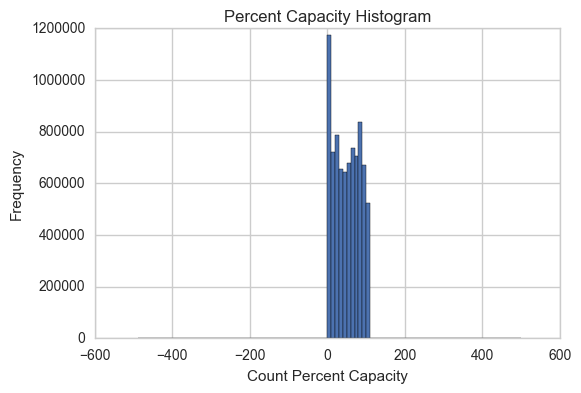

In [34]:
# Look at the distribution of percent capacities for full year of full data for all stations
discrete_bike_data_only = discrete_bike_data.copy()
pd.DataFrame.hist(discrete_bike_data_only, column='Count_Percent_Capacity',
                  bins=100, range=(-500,500))
plt.xlabel('Count Percent Capacity')
plt.ylabel('Frequency')
plt.title('Percent Capacity Histogram');

In [35]:
# What is the range of possible values of percent capacity?
print('Min percent capacity:', min(discrete_bike_data_only['Count_Percent_Capacity']))
print('Max percent capacity:', max(discrete_bike_data_only['Count_Percent_Capacity']))

Min percent capacity: 0.0
Max percent capacity: 100.0


Below I use boxplots to visualize the percent capacity for each station. Every 35 stations are plotted below:

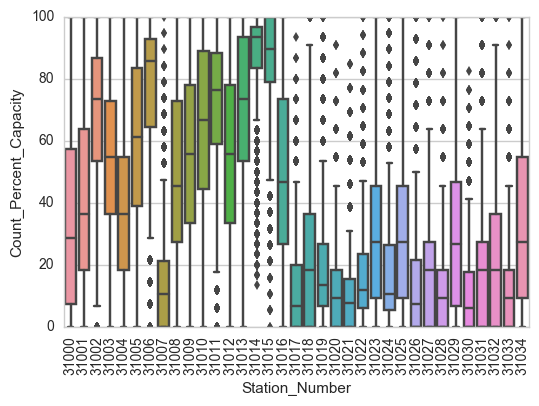

In [36]:
# Stations start - 35

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[0:35]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

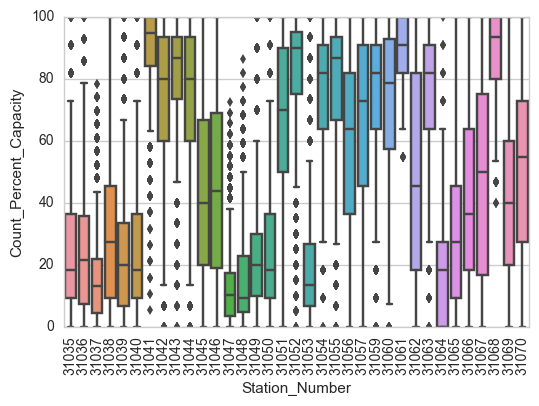

In [37]:
# Stations 35 - 70

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[35:70]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

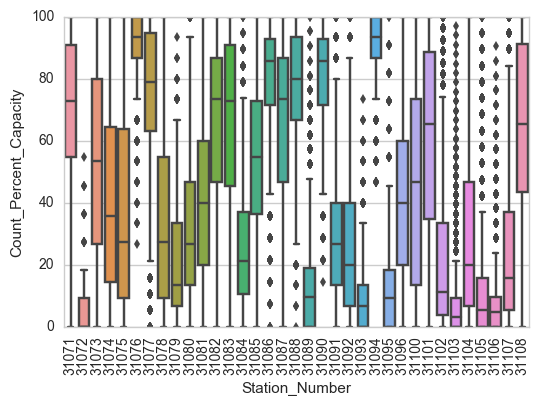

In [38]:
# Stations 70 - 105

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[70:105]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

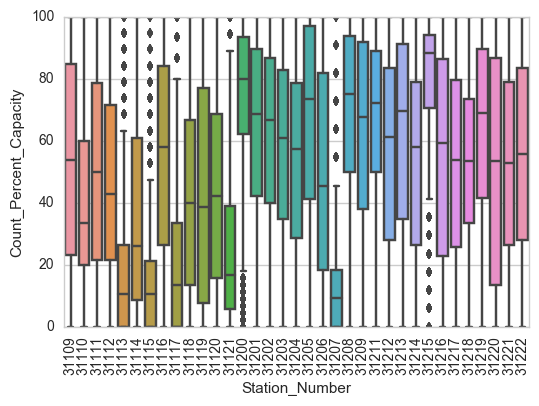

In [39]:
# Stations 105 - 140

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[105:140]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

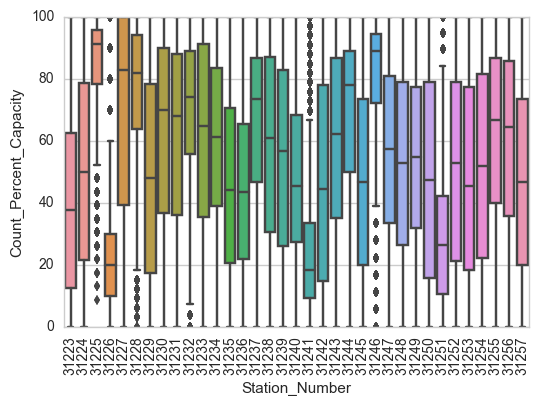

In [40]:
# Stations 140 - 175

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[140:175]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

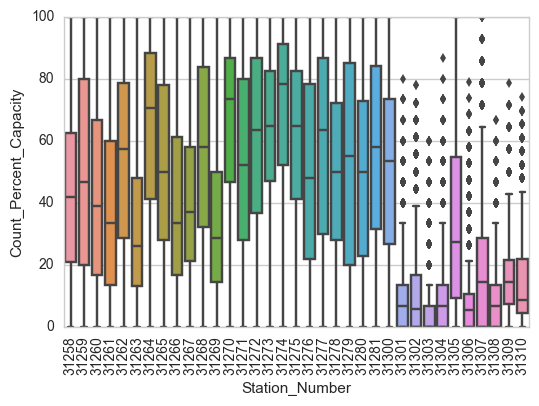

In [41]:
# Stations 175 - 210

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[175:210]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

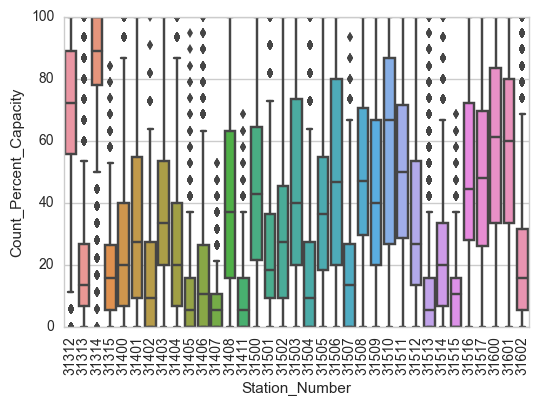

In [42]:
# Stations 210 - 245

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[210:245]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

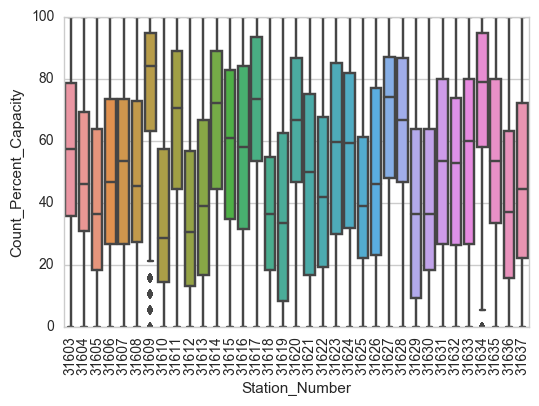

In [43]:
# Stations 245 - 280

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[245:280]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

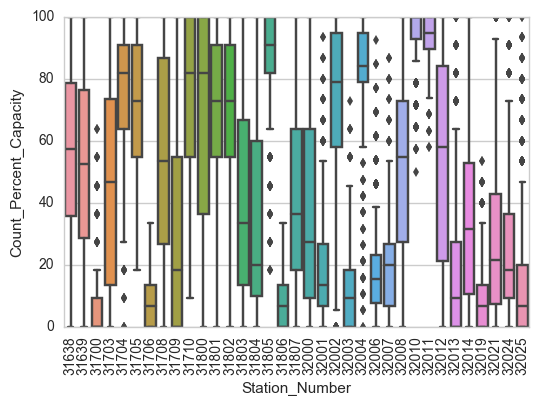

In [44]:
# Stations 280 - 315

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[280:315]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

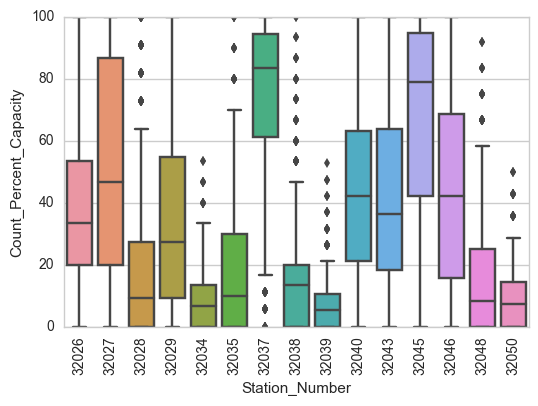

In [45]:
# Stations 315 - end

station_list = []
for station in sorted(list(bike_data['Start_Station_Number'].unique()))[315:]:
    station_list.append(int(station))

discrete_bike_data_filtered = discrete_bike_data_only[discrete_bike_data_only['Station_Number'].isin(station_list)]
ax = sns.boxplot(x="Station_Number", y="Count_Percent_Capacity", data=discrete_bike_data_filtered)
plt.xticks(rotation=90);

## Does it make sense to analyze every single station? 
The combined dataframe looks like it is sound. Remembering the detail above when not all stations had outage data (meaning they did not go empty or full over the outage data time period) I wonder whether all stations have enough data for forecasting or whether some stations have longer periods of time without use. I explore and address the following two questions:  
1) Are there stations with less than 90% of the date range of the station with the largest date range?  
2) Are there stations with less than 4 instances per hour per day, on average?

#### 1) Are there stations with less than 90% of the date range of the station with the largest date range?

In [46]:
# Find the number of days for each station
num_days_dict = {}
for station in list(discrete_bike_data_only['Station_Number'].unique()):
    temp_df = discrete_bike_data_only[discrete_bike_data_only['Station_Number'] == station]
    days = int(str(temp_df['Date'].max() - temp_df['Date'].min()).split(' days')[0])
    num_days_dict[station] = days

In [47]:
# Find the stations with less than 90% of the max total days
max_days = max(num_days_dict.values())
too_few_days = {}

for station in list(num_days_dict.keys()):
    if num_days_dict[station] <= max_days*.90:
        too_few_days[station] = num_days_dict[station]
        
# How many stations have less than 90% of the max total days
print('{} stations with less than 90% of the max total days.'.format(len(list(too_few_days.keys()))))

6 stations with less than 90% of the max total days.


In [48]:
# Take discrete_bike_data_only and filter out any stations with too few days
reduced_discrete_bike_data = discrete_bike_data_only[np.logical_not(discrete_bike_data_only['Station_Number'].isin(list(too_few_days.keys())))]

# Did I take out too much data?
reduced_discrete_bike_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8131333 entries, 24 to 55559
Data columns (total 6 columns):
Date                      datetime64[ns]
Start_Station_Capacity    float64
Station_Number            int64
Status                    object
Bike_Count                int64
Count_Percent_Capacity    float64
dtypes: datetime64[ns](1), float64(2), int64(2), object(1)
memory usage: 434.3+ MB


#### 2) Are there stations with less than 4 instances per hour per day, on average?

In [49]:
# Find the number of instances for each station
reduced_discrete_bike_data_counts = pd.DataFrame(pd.value_counts(reduced_discrete_bike_data['Station_Number']))
reduced_discrete_bike_data_counts.reset_index(drop=False, inplace=True)
reduced_discrete_bike_data_counts.columns=['Station_Number', 'Count']
reduced_discrete_bike_data_counts['Count'] = reduced_discrete_bike_data_counts['Count'].astype(int)

In [428]:
# Find the stations without at least 4 instances per hour per day of data
too_few_instances = {}
for station in list(reduced_discrete_bike_data_counts['Station_Number'].unique()):
    if int(reduced_discrete_bike_data_counts.loc[reduced_discrete_bike_data_counts['Station_Number'] == station, 'Count'].item()) < int((num_days_dict[station]*4*24)):
        too_few_instances[station] = reduced_discrete_bike_data_counts.loc[reduced_discrete_bike_data_counts['Station_Number'] == station, 'Count'].iloc[0]
        
# How many stations are without at least 4 instances per hour per day of data?
print('{} stations without at least 4 instances per hour per day of data.'.format(len(too_few_instances)))

257 stations without at least 4 instances per hour per day of data.


In [433]:
# Take reduced_discrete_bike_data and further filter out any stations that do not have at least 4 instancez per hour per day of operation
reduced_discrete_bike_data = reduced_discrete_bike_data[np.logical_not(reduced_discrete_bike_data['Station_Number'].isin(list(too_few_instances.keys())))]

# Did I take out too much data?
reduced_discrete_bike_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4462394 entries, 24 to 55559
Data columns (total 6 columns):
Date                      datetime64[ns]
Start_Station_Capacity    float64
Station_Number            int64
Status                    object
Bike_Count                int64
Count_Percent_Capacity    float64
dtypes: datetime64[ns](1), float64(2), int64(2), object(1)
memory usage: 238.3+ MB


In [407]:
# Sanity check after the above reductions
print('{} stations left for analysis.'.format(len(list(reduced_discrete_bike_data['Station_Number'].unique()))))

67 stations left for analysis.


In [408]:
# Are there any missing values?
for column in reduced_discrete_bike_data.columns:
    print(column, ':', len(reduced_discrete_bike_data[reduced_discrete_bike_data[column].isnull()]))   

Date : 0
Start_Station_Capacity : 0
Station_Number : 0
Status : 0
Bike_Count : 0
Count_Percent_Capacity : 0


## How do we handle the fact that the data is irregular?
Since the timeseries was made up of every single pick and drop off of bikes within the time period, the data is very irregular. To change this, I will upsample to every 1 hour and use linear interpolation to fill in the new percent capacity values:

In [409]:
# For each station, resample data for every 1 hour and use a forward fill to create a new dataframe
new_target_discrete_bike_data = pd.DataFrame()
add_hour = datetime.timedelta(hours=1)

for station in list(reduced_discrete_bike_data['Station_Number'].unique()):
    temp_df = reduced_discrete_bike_data[reduced_discrete_bike_data['Station_Number'] == station]
    
    start = temp_df['Date'].iloc[0] + datetime.timedelta(seconds=1)
    end = temp_df['Date'].iloc[-1]
    new_datetimes = []

    while start <= (end + add_hour):
        new_datetimes.append(start)
        start += add_hour
        
    new_datetimes_df = pd.DataFrame({'Date':new_datetimes, 
                                     'Station_Number':'new_datetime'})
    
    updated_temp_df = temp_df.append(new_datetimes_df)
    updated_temp_df.sort_values(by='Date', inplace=True)
    updated_temp_df['Count_Percent_Capacity'] = updated_temp_df['Count_Percent_Capacity'].interpolate(method='linear')
    updated_temp_df = updated_temp_df[updated_temp_df['Station_Number'] != station]
    updated_temp_df['Station_Number'] = station
    
    new_target_discrete_bike_data = new_target_discrete_bike_data.append(updated_temp_df)

In [410]:
# How much data do I have now?
new_target_discrete_bike_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 735218 entries, 0 to 10308
Data columns (total 6 columns):
Bike_Count                0 non-null float64
Count_Percent_Capacity    735218 non-null float64
Date                      735218 non-null datetime64[ns]
Start_Station_Capacity    0 non-null float64
Station_Number            735218 non-null int64
Status                    0 non-null object
dtypes: datetime64[ns](1), float64(3), int64(1), object(1)
memory usage: 39.3+ MB


<a id='specificbaseline'></a>  
# Inspection of a single station
I now have an good baseline dataset that shows station percent capacity values over time. I will now explore the data for one station, 31116.  
[Back to Top](#top)

In [57]:
# Now I can drop the unnecessary columns
new_target_discrete_bike_data = new_target_discrete_bike_data.drop(['Start_Station_Capacity',
                                                                    'Status', 'Bike_Count'], axis=1)

# Display
new_target_discrete_bike_data.head()

,Count_Percent_Capacity,Date,Station_Number
0,2.631579,2015-07-01 08:25:01,31116
1,2.631579,2015-07-01 09:25:01,31116
2,2.631579,2015-07-01 10:25:01,31116
3,1.315789,2015-07-01 11:25:01,31116
4,2.631579,2015-07-01 12:25:01,31116


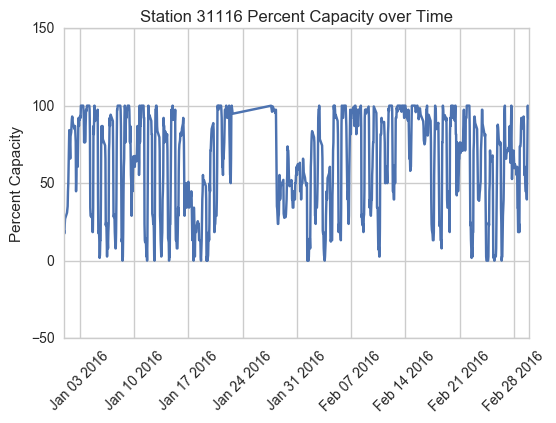

In [62]:
# Look at the time series for station 31116
new_reduced_31116 = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == 31116]
plt.plot(new_reduced_31116['Date'], new_reduced_31116['Count_Percent_Capacity'])
plt.ylim(-50, 150)
plt.xlim('2016-01-01 00:00:00', '2016-03-01 00:00:00') # random window for visualization purposes
plt.title('Station 31116 Percent Capacity over Time')
plt.ylabel('Percent Capacity')
plt.xticks(rotation=45);

Now I inspect this particular station's distribution over different time periods:

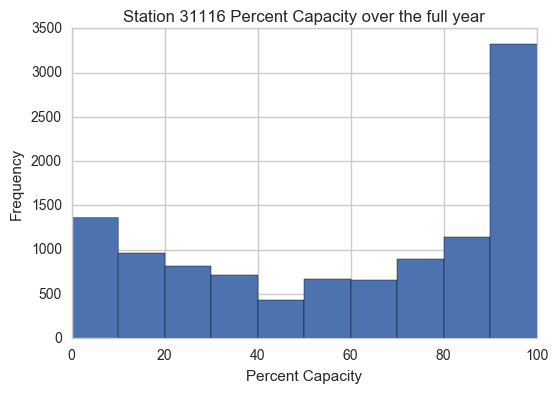

In [67]:
# Isolate station 31116
discrete_bike_data_31116 = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == 31116]

# Look at its distribution over the full year of data
pd.DataFrame.hist(discrete_bike_data_31116, column='Count_Percent_Capacity')
pl.title('Station 31116 Percent Capacity over the full year')
plt.ylabel('Frequency')
plt.xlabel('Percent Capacity');

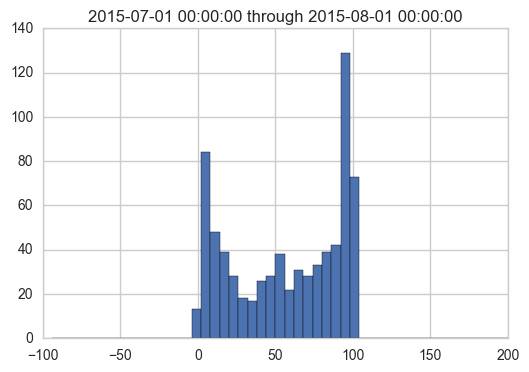

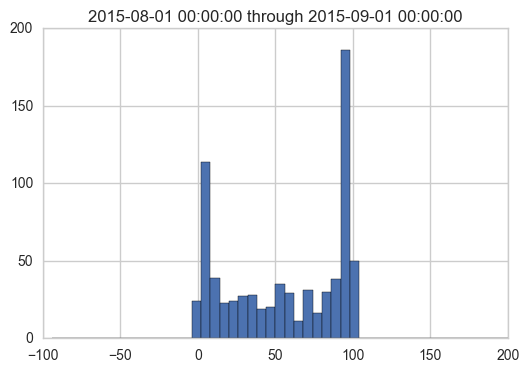

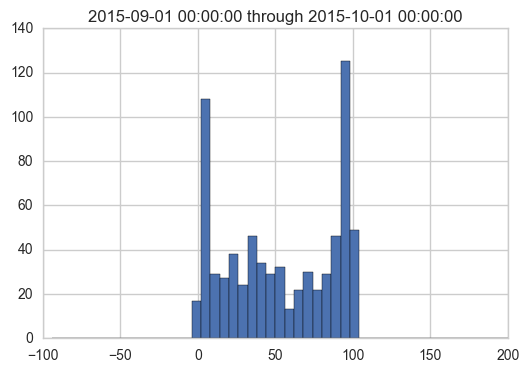

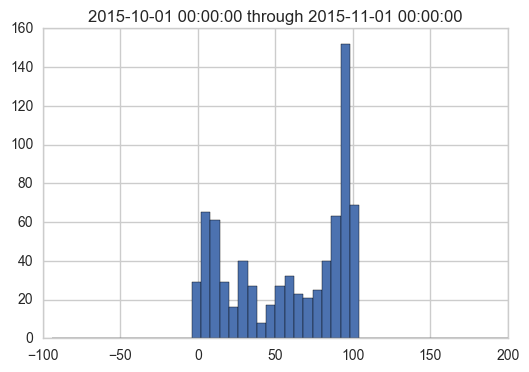

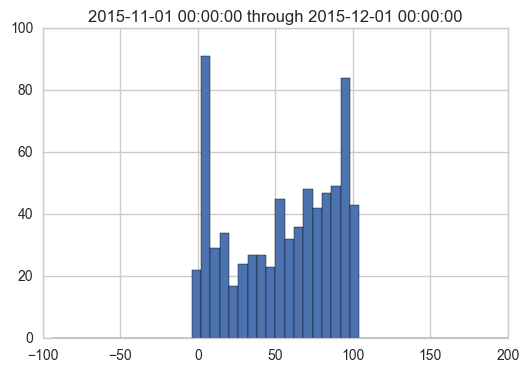

...

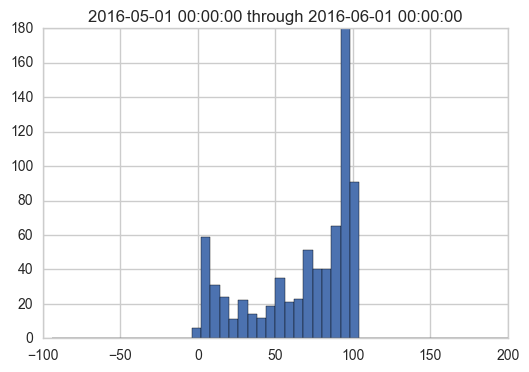

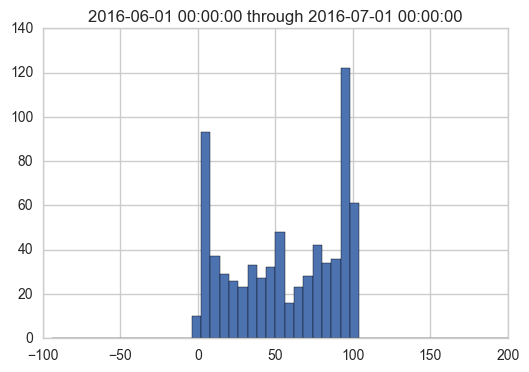

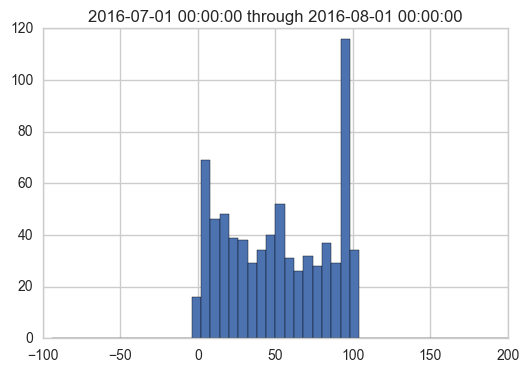

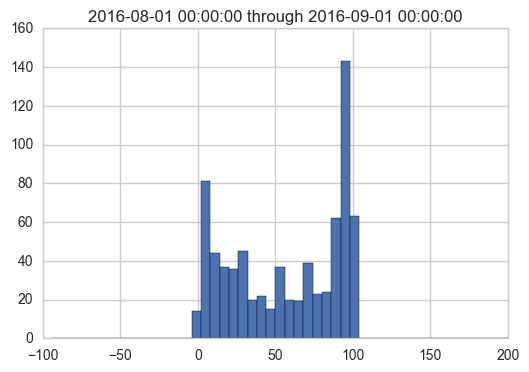

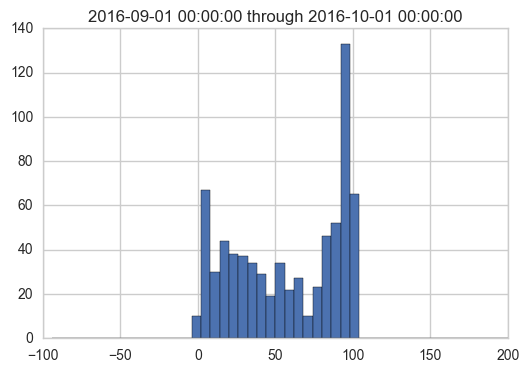

In [224]:
# Look at distributions each month
start = pd.to_datetime('2015-07-01 00:00:00')
end = pd.to_datetime('2015-08-01 00:00:00')
stop = pd.to_datetime('2016-10-01 00:00:00')
add_month = relativedelta(months=1)

while end <= stop:
    pd.DataFrame.hist(discrete_bike_data_31116[((discrete_bike_data_31116['Date'] >= start) & 
                                                (discrete_bike_data_31116['Date'] <= end))], 
                      column='Count_Percent_Capacity', 
                      bins=50, range=(-100,200))
    pl.title(str(start) + ' through ' + str(end))
    start += add_month
    end += add_month

/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


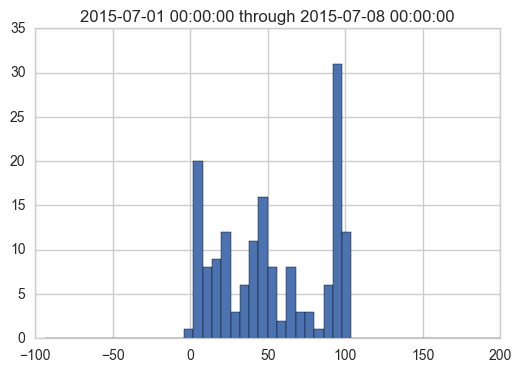

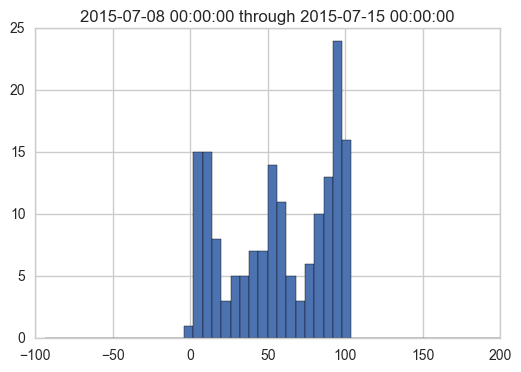

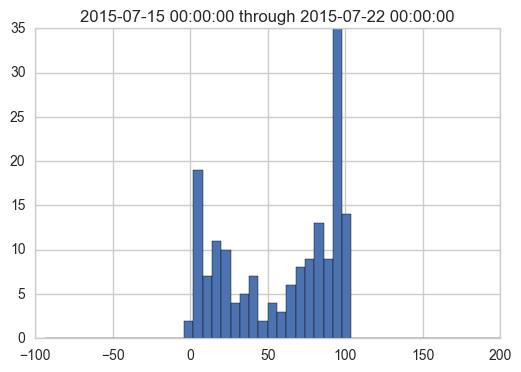

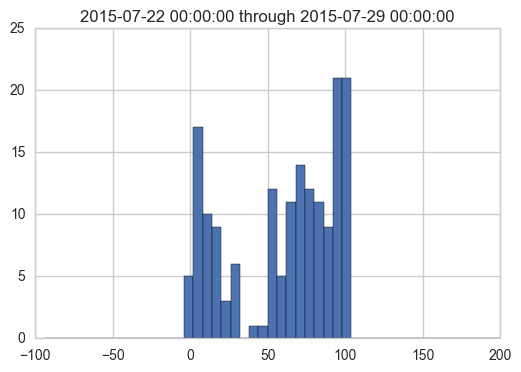

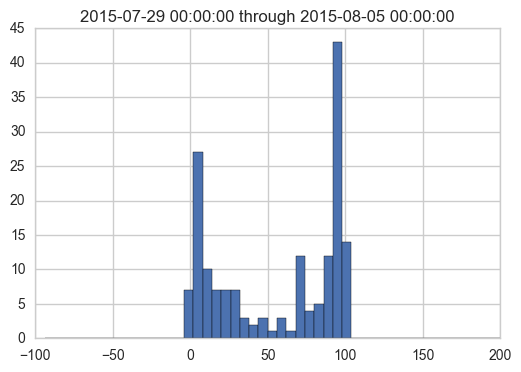

...

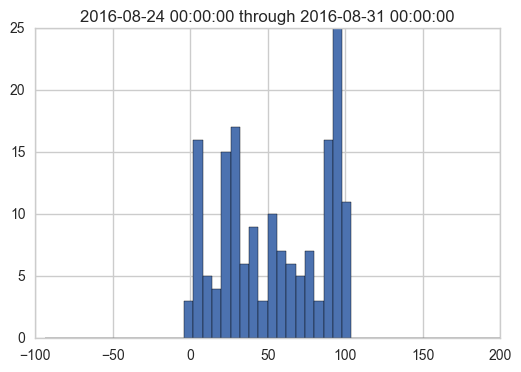

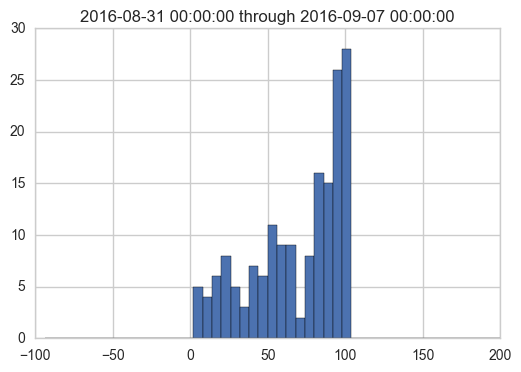

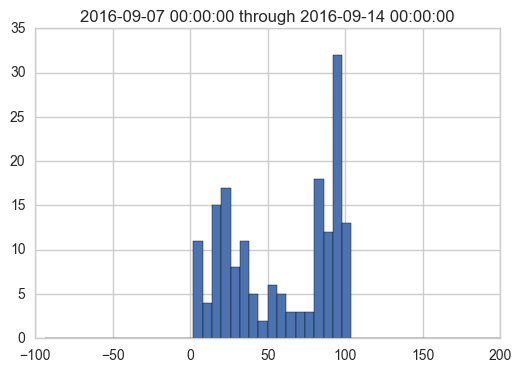

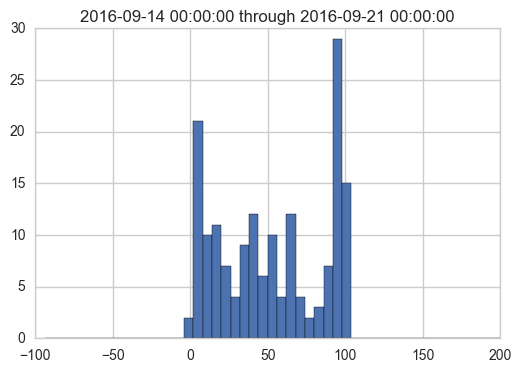

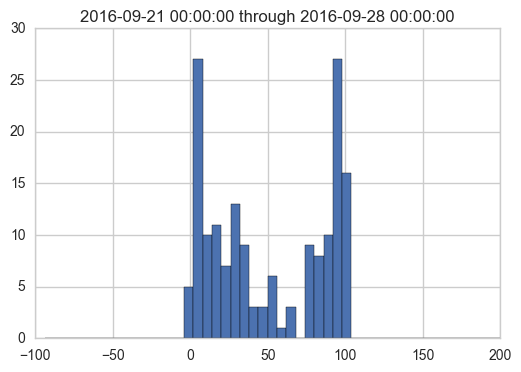

In [225]:
# Look at distributions each week
start = pd.to_datetime('2015-07-01 00:00:00')
end = pd.to_datetime('2015-07-08 00:00:00')
stop = pd.to_datetime('2016-10-01 00:00:00')
add_week = datetime.timedelta(days=7)

while end <= stop:
    pd.DataFrame.hist(discrete_bike_data_31116[((discrete_bike_data_31116['Date'] >= start) & 
                                                (discrete_bike_data_31116['Date'] <= end))], 
                      column='Count_Percent_Capacity', 
                      bins=50, range=(-100,200))
    pl.title(str(start) + ' through ' + str(end))
    start += add_week
    end += add_week

/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


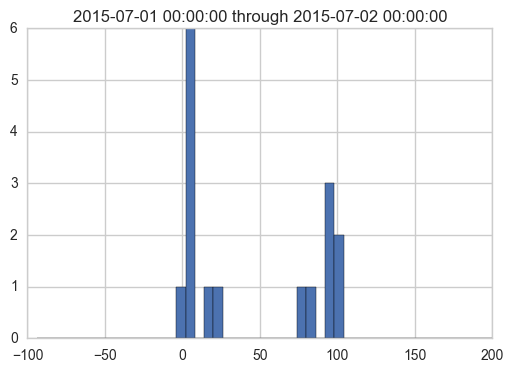

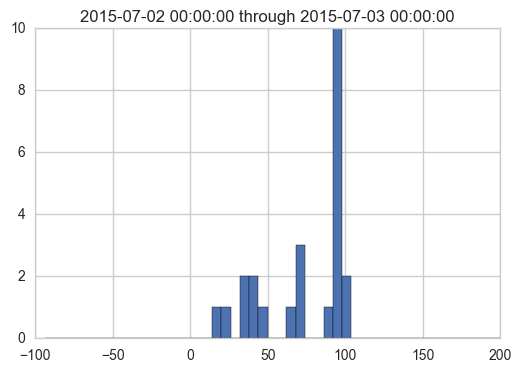

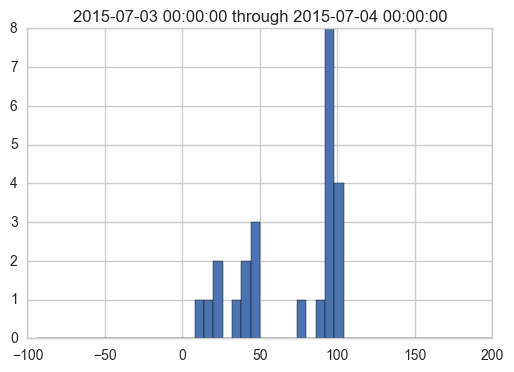

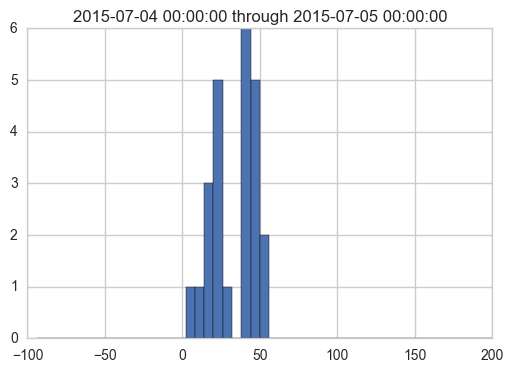

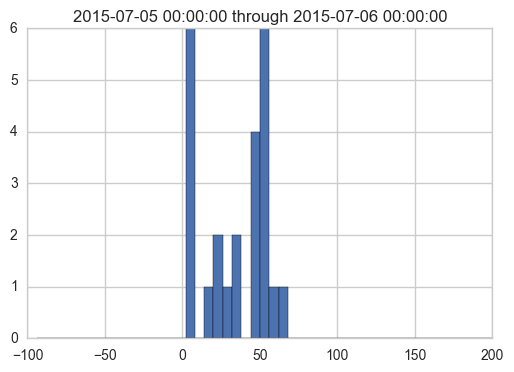

...

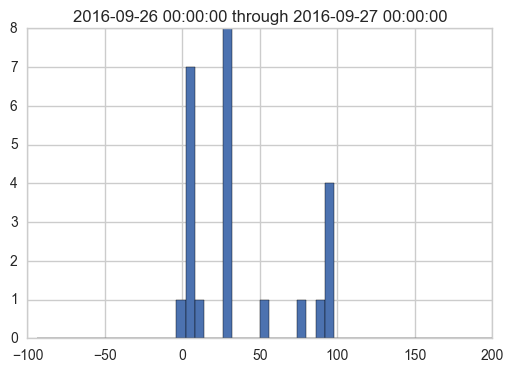

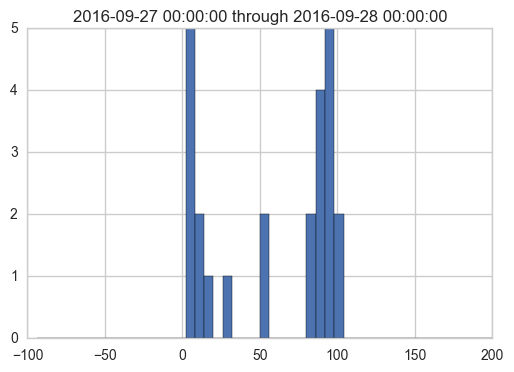

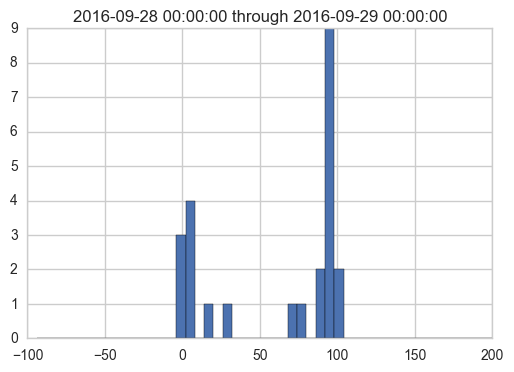

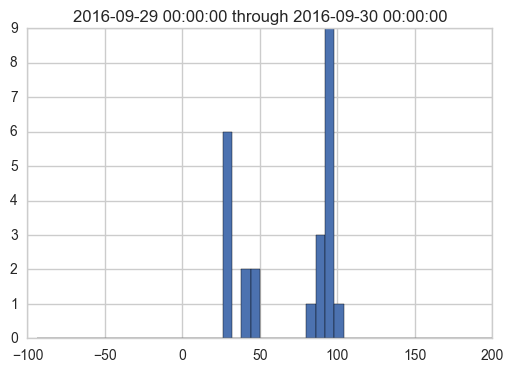

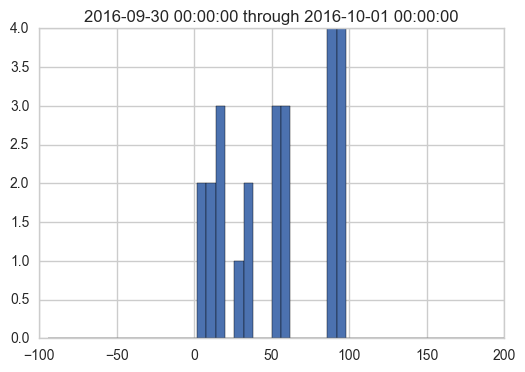

In [226]:
# Look at distributions each day
start = pd.to_datetime('2015-07-01 00:00:00')
end = pd.to_datetime('2015-07-02 00:00:00')
stop = pd.to_datetime('2016-10-01 00:00:00')
add_day = datetime.timedelta(days=1)

while end <= stop:
    pd.DataFrame.hist(discrete_bike_data_31116[((discrete_bike_data_31116['Date'] >= start) & 
                                                (discrete_bike_data_31116['Date'] <= end))], 
                      column='Count_Percent_Capacity', 
                      bins=50, range=(-100,200))
    pl.title(str(start) + ' through ' + str(end))
    start += add_day
    end += add_day

# EXTRA PROCESSING - TAKE OUT LATER

In [227]:
# Write the data to a file for later use
#os.chdir('/Users/WhoaaaItsDavid/Desktop/Springboard/Bike_Share')
#file = open('new_target_discrete_bike_data_V2.csv', 'w')
#file.write(new_target_discrete_bike_data.to_csv())
#file.close()

<a id='specificforecast'></a>  
# Forecast for a single station  
I will now create a forecast model for station 31116, which I will later generalize to all stations:  
[Back to Top](#top)

In [68]:
# Isolate station 31116
reduced_31116 = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == 31116]
reduced_31116.set_index('Date', inplace=True)
reduced_31116.drop('Station_Number', axis=1, inplace=True)
reduced_31116.head()

,Count_Percent_Capacity
Date,
2015-07-01 08:25:01,2.631579
2015-07-01 09:25:01,2.631579
2015-07-01 10:25:01,2.631579
2015-07-01 11:25:01,1.315789
2015-07-01 12:25:01,2.631579


In [69]:
# Create a Series object
reduced_31116_series = reduced_31116['Count_Percent_Capacity'] 
reduced_31116_series.head()

Date
2015-07-01 08:25:01    2.631579
2015-07-01 09:25:01    2.631579
2015-07-01 10:25:01    2.631579
2015-07-01 11:25:01    1.315789
2015-07-01 12:25:01    2.631579
Name: Count_Percent_Capacity, dtype: float64

In [85]:
# Define function for a test for stationarity
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = pd.DataFrame.rolling(timeseries, window=12,center=False).mean()
    rolstd = pd.DataFrame.rolling(timeseries, window=12,center=False).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='upper left')
    plt.title('Rolling Mean & Standard Deviation')
    plt.xticks(rotation=45)
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

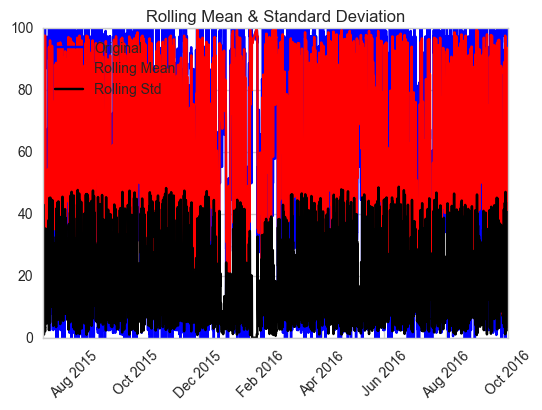

Results of Dickey-Fuller Test:
Test Statistic                -1.232103e+01
p-value                        6.750624e-23
#Lags Used                     3.900000e+01
Number of Observations Used    1.094500e+04
Critical Value (5%)           -2.861804e+00
Critical Value (1%)           -3.430948e+00
Critical Value (10%)          -2.566911e+00
dtype: float64


In [86]:
# Test the series for stationarity
test_stationarity(reduced_31116_series)

We are 99% confident that the series is stationary, so we continue.

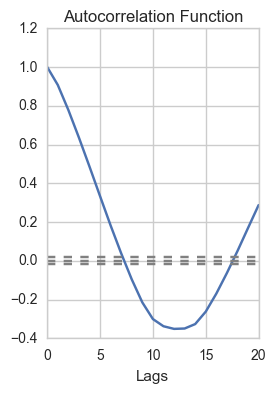

In [87]:
# Plot ACF: 
plt.subplot(121) 
lag_acf = acf(reduced_31116_series, nlags=20)
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(reduced_31116_series)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(reduced_31116_series)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')
plt.xlabel('Lags');
#plt.ylim(-.05, .05);

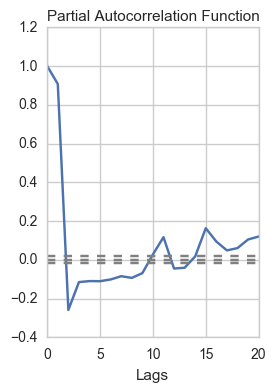

In [91]:
# Plot PACF:
plt.subplot(122)
lag_pacf = pacf(reduced_31116_series, nlags=20, method='ols')
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(reduced_31116_series)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(reduced_31116_series)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function', size=11);
plt.xlabel('Lags');
#plt.ylim(-.05, .05);

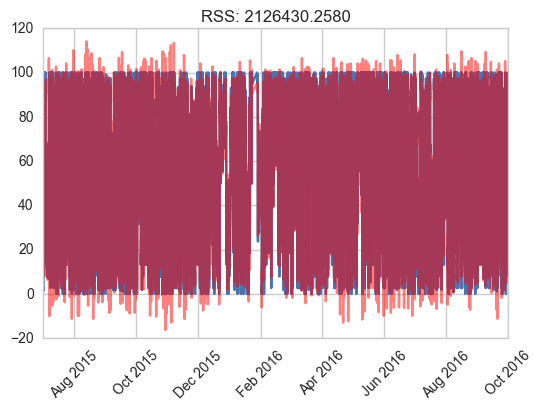

In [105]:
# Create AR Model
model = ARIMA(reduced_31116_series, order=(2, 0, 0))  
results_AR = model.fit(disp=-1)  
plt.plot(reduced_31116_series)
plt.plot(results_AR.fittedvalues, color='red', alpha=0.5)
plt.title('RSS: %.4f'% sum((results_AR.fittedvalues-reduced_31116_series)**2))
plt.xticks(rotation=45);

In [82]:
# Create MA Model
model = ARIMA(reduced_31116_series, order=(0, 0, 7))  
results_MA = model.fit(disp=-1)  
plt.plot(reduced_31116_series)
plt.plot(results_MA.fittedvalues, color='red', alpha=0.5)
plt.title('RSS: %.4f'% sum((results_MA.fittedvalues-reduced_31116_series)**2))
plt.xticks(rotation=45);

ValueError: The computed initial MA coefficients are not invertible
You should induce invertibility, choose a different model order, or you can
pass your own start_params.

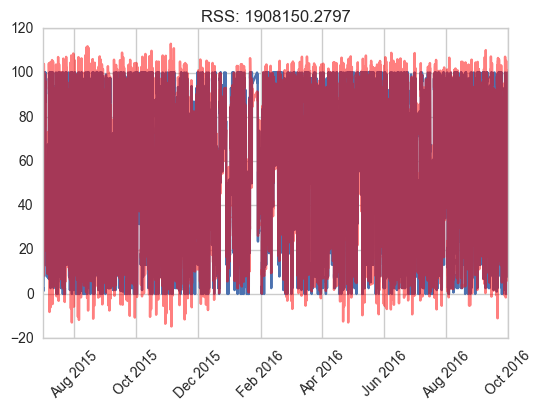

In [339]:
# Create ARIMA Model
model = ARIMA(reduced_31116_series, order=(2, 0, 7))  
results_ARIMA = model.fit(disp=-1)  
plt.plot(reduced_31116_series)
plt.plot(results_ARIMA.fittedvalues, color='red', alpha=0.5)
plt.title('RSS: %.4f'% sum((results_ARIMA.fittedvalues-reduced_31116_series)**2))
plt.xticks(rotation=45);

The ARIMA model takes significantly more time to train than the AR model (without much gain), so I continue with the AR model below:

In [340]:
# Show AR model summary
results_AR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                ARMA Model Results                                
==================================================================================
Dep. Variable:     Count_Percent_Capacity   No. Observations:                10985
Model:                         ARMA(2, 0)   Log Likelihood              -44502.793
Method:                           css-mle   S.D. of innovations             13.904
Date:                    Mon, 17 Apr 2017   AIC                          89013.586
Time:                            11:35:24   BIC                          89042.804
Sample:                        07-01-2015   HQIC                         89023.430
                             - 10-01-2016                                         
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                           59.0130      1.144     51.602      0.000      56.772      61.254
ar.L1.Count_Percent_Capacity     1.1427      0.009    123.991      0.000       1.125       1.161
ar.L2.Count_Percent_Capacity    -0.2586      0.009    -28.059      0.000      -0.277      -0.241
                                    Roots                                    
=============================================================================
                 Real           Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.2023           +0.0000j            1.2023            0.0000
AR.2            3.2161           +0.0000j            3.2161            0.0000
-----------------------------------------------------------------------------
"""

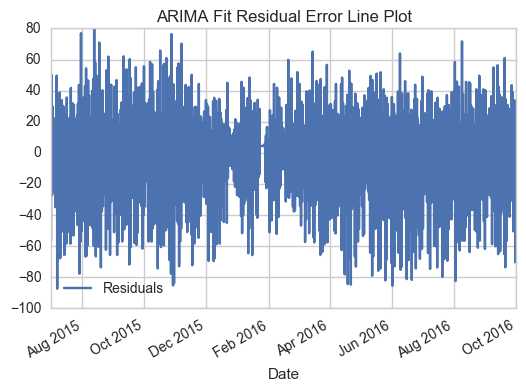

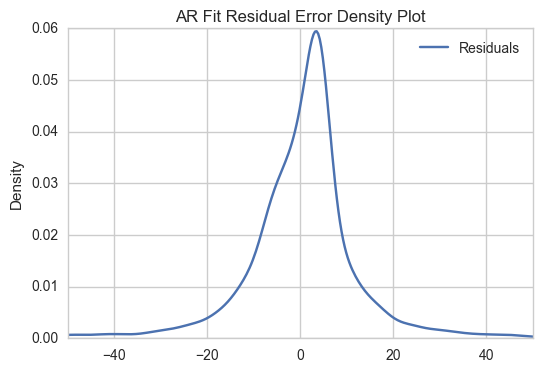

Describe residuals:
          Residuals
count  10985.000000
mean       0.002038
std       13.913786
min      -87.352938
25%       -5.033764
50%        1.715438
75%        5.000179
max       79.970152


In [341]:
# Plot AR residual errors
residuals = pd.DataFrame(results_AR.resid, columns=['Residuals'])
residuals.plot()
plt.title('ARIMA Fit Residual Error Line Plot')
plt.show()

residuals.plot(kind='kde')
plt.xlim(-50,50)
plt.title('AR Fit Residual Error Density Plot')
plt.show()

print('Describe residuals:')
print(residuals.describe())

Below is a rolling forecast with the AR model order (2,0,0). I train on the first 99% of the data and test on the last 1% of the data:

In [342]:
# Rolling Forecast
X = reduced_31116_series
size = int(len(X) * 0.99)
train, test = X[:size], X[size:len(X)]
history_AR = [x for x in train]
predictions_AR = list()
for t in range(len(test)):
    model_AR = ARIMA(history_AR, order=(2,0,0))
    model_fit_AR = model_AR.fit(disp=0)
    output_AR = model_fit_AR.forecast()
    yhat_AR = output_AR[0]
    predictions_AR.append(yhat_AR)
    obs_AR = test[t]
    history_AR.append(obs_AR)
    print('predicted=%f, expected=%f' % (yhat_AR, obs_AR))

predicted=14.936221, expected=2.631579
predicted=7.800334, expected=2.631579
predicted=9.150010, expected=5.263158
predicted=12.151450, expected=5.263158
predicted=11.473499, expected=13.157895
predicted=20.482655, expected=2.631579
predicted=6.439643, expected=50.000000
predicted=63.192471, expected=76.315789
predicted=81.069492, expected=92.105263
predicted=92.330477, expected=92.105263
predicted=88.273579, expected=92.105263
predicted=88.274163, expected=86.842105
predicted=82.267802, expected=92.105263
predicted=89.627754, expected=92.982456
predicted=89.277283, expected=91.228070
predicted=87.050203, expected=88.421053
predicted=84.297893, expected=87.368421
predicted=83.818333, expected=86.315789
predicted=82.887858, expected=85.263158
predicted=81.957404, expected=81.578947
predicted=78.023552, expected=50.000000
predicted=42.928784, expected=26.315789
predicted=24.008476, expected=2.631579
predicted=3.057644, expected=2.631579
predicted=9.153454, expected=2.631579
predicted=9.1

Test MSE: 200.601
Test RMSE: 14.163


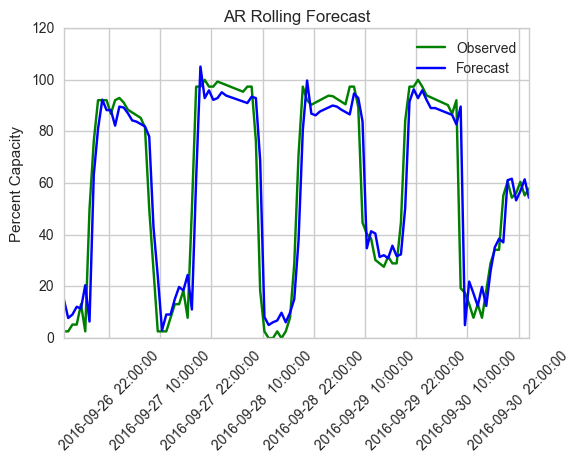

In [362]:
# Make temp df to handle dates and prediction values
pred_temp_df = pd.DataFrame(test)
pred_temp_df['predictions'] = predictions_AR
pred_temp_df['predictions'] = pred_temp_df['predictions'].astype(float)

# Display error rates
error = mean_squared_error(test, predictions_AR)
print('Test MSE: %.3f' % error)
print('Test RMSE: %.3f' % error**0.5)

# Plot forecasts
ax = plt.gca()
xfmt = md.DateFormatter('%Y-%m-%d  %H:%M:%S')
ax.xaxis.set_major_formatter(xfmt)
ax.plot(pred_temp_df['Count_Percent_Capacity'], color='green', label='Observed')
ax.plot(pred_temp_df['predictions'], color='blue', label='Forecast')
plt.legend(loc='upper right')
plt.title('AR Rolling Forecast')
plt.ylabel('Percent Capacity')
plt.xticks(rotation=45);

The rolling forecast looks very nice, but it is not very helpful when trying to forecast values further out. ARIMA models tend to converge to the mean at this point. Below, I continue with a SARIMAX model. I train on the last 9.5% for the data, and test on the last 0.5% of the data:

## SARIMA WITH SEASONAL COMPONENT

/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


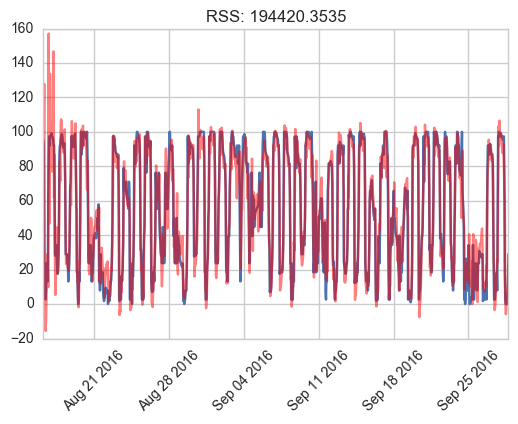

In [374]:
# SARIMAX Model without exogs WITH SEASONAL COMPONENT
X = reduced_31116_series
size = int(len(X) * 0.995)
X_train, X_test = X[(int(len(X) * 0.90)):size], X[size:]

model = SARIMAX(X_train,
                enforce_stationarity=False,
                enforce_invertibility=False,
                order=(2, 0, 7),
                seasonal_order=(0,1,2,12), 
                trend='c')
results_SARIMAX = model.fit()
plt.plot(X_train)
plt.plot(results_SARIMAX.fittedvalues, color='red', alpha=.5)
plt.title('RSS: %.4f'% sum((results_SARIMAX.fittedvalues-X_train)**2))
plt.xticks(rotation=45);

In [375]:
# Show SARIMA summary
results_SARIMAX.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:             Count_Percent_Capacity   No. Observations:                 1044
Model:             SARIMAX(2, 0, 7)x(0, 1, 2, 12)   Log Likelihood               -3928.467
Date:                            Mon, 17 Apr 2017   AIC                           7882.934
Time:                                    15:21:32   BIC                           7947.295
Sample:                                08-16-2016   HQIC                          7907.345
                                     - 09-28-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0041      0.006     -0.670      0.503      -0.016       0.008
ar.L1          1.9025      0.010    183.067      0.000       1.882       1.923
ar.L2         -0.9707      0.009   -103.090      0.000      -0.989      -0.952
ma.L1         -0.9731      0.031    -31.261      0.000      -1.034      -0.912
ma.L2          0.0802      0.042      1.917      0.055      -0.002       0.162
ma.L3          0.0432      0.044      0.976      0.329      -0.044       0.130
ma.L4          0.0199      0.050      0.395      0.693      -0.079       0.119
ma.L5          0.0083      0.052      0.160      0.873      -0.094       0.110
ma.L6          0.0765      0.054      1.426      0.154      -0.029       0.182
ma.L7          0.0954      0.037      2.605      0.009       0.024       0.167
ma.S.L12      -0.9849      0.308     -3.201      0.001      -1.588      -0.382
ma.S.L24      -0.0162      0.038     -0.426      0.670      -0.090       0.058
sigma2       144.3646     43.330      3.332      0.001      59.439     229.290
===================================================================================
Ljung-Box (Q):                       53.73   Jarque-Bera (JB):               408.80
Prob(Q):                              0.07   Prob(JB):                         0.00
Heteroskedasticity (H):               1.08   Skew:                            -0.54
Prob(H) (two-sided):                  0.49   Kurtosis:                         5.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

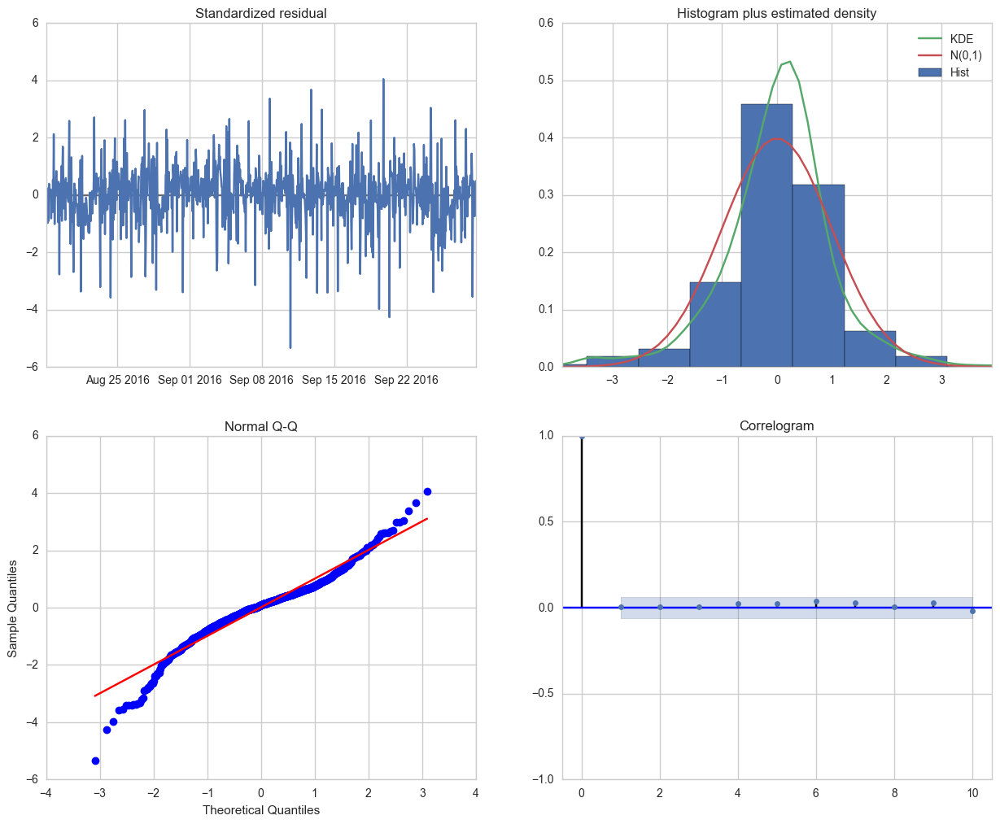

In [376]:
# Plot SARIMA diagnostics
results_SARIMAX.plot_diagnostics(figsize=(15, 12))
plt.show()

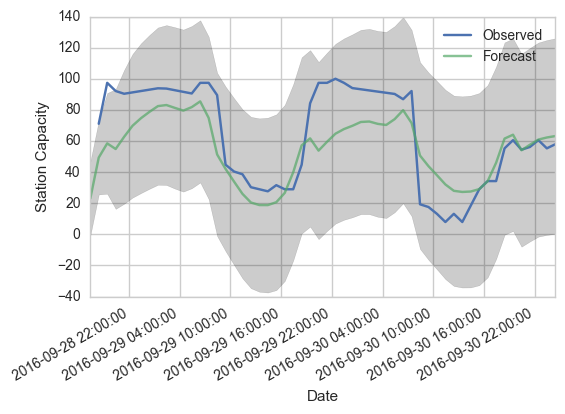

In [377]:
# Compare the forecast to the original data without a dynamic forecast
pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                      end=X_test.index[-1],
                                      dynamic=False)
pred_ci = pred.conf_int()

ax = plt.gca()
xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
ax.xaxis.set_major_formatter(xfmt)

ax = X_test.plot(label='Observed')
pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Station Capacity')
plt.legend()

plt.show()

In [378]:
# Extract the predicted and true values of our time series
y_forecasted = pred.predicted_mean
y_truth = X_test

# Compute the mean squared error
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('RMSE: {:.2f}'.format(mse**0.5))

The Mean Squared Error of our forecasts is 390.98
RMSE: 19.77


## SARIMA WITHOUT SEASONAL COMPONENT

/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


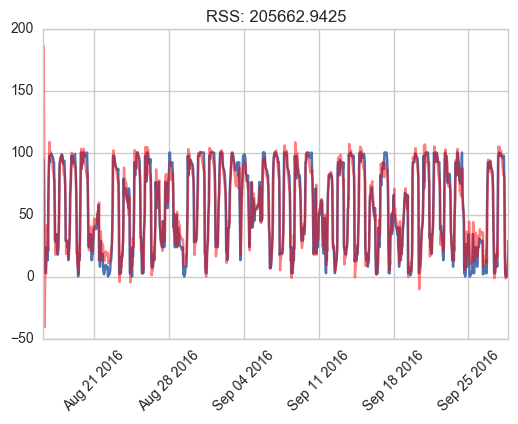

In [381]:
# SARIMAX Model without exogs WITHOUT SEASONAL COMPONENT
X = reduced_31116_series
size = int(len(X) * 0.995)
X_train, X_test = X[(int(len(X) * 0.90)):size], X[size:]

model = SARIMAX(X_train,
                enforce_stationarity=False,
                enforce_invertibility=False,
                order=(2, 0, 7),
                #seasonal_order=(0,1,2,12), 
                trend='c')
results_SARIMAX = model.fit()
plt.plot(X_train)
plt.plot(results_SARIMAX.fittedvalues, color='red', alpha=.5)
plt.title('RSS: %.4f'% sum((results_SARIMAX.fittedvalues-X_train)**2))
plt.xticks(rotation=45);

In [382]:
# Show SARIMA summary
results_SARIMAX.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             Statespace Model Results                             
==================================================================================
Dep. Variable:     Count_Percent_Capacity   No. Observations:                 1044
Model:                   SARIMAX(2, 0, 7)   Log Likelihood               -4146.218
Date:                    Tue, 18 Apr 2017   AIC                           8314.435
Time:                            08:44:03   BIC                           8368.894
Sample:                        08-16-2016   HQIC                          8335.090
                             - 09-28-2016                                         
Covariance Type:                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      3.9094      0.228     17.129      0.000       3.462       4.357
ar.L1          1.9068      0.012    164.851      0.000       1.884       1.929
ar.L2         -0.9759      0.010    -93.879      0.000      -0.996      -0.956
ma.L1         -0.9140      0.037    -24.798      0.000      -0.986      -0.842
ma.L2         -0.0635      0.049     -1.298      0.194      -0.159       0.032
ma.L3          0.0814      0.056      1.454      0.146      -0.028       0.191
ma.L4          0.0364      0.057      0.641      0.522      -0.075       0.148
ma.L5          0.0435      0.060      0.720      0.472      -0.075       0.162
ma.L6          0.0314      0.066      0.477      0.633      -0.097       0.160
ma.L7          0.1170      0.047      2.514      0.012       0.026       0.208
sigma2       187.8393      7.076     26.547      0.000     173.971     201.708
===================================================================================
Ljung-Box (Q):                      209.94   Jarque-Bera (JB):               688.52
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.11   Skew:                            -0.50
Prob(H) (two-sided):                  0.31   Kurtosis:                         6.87
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

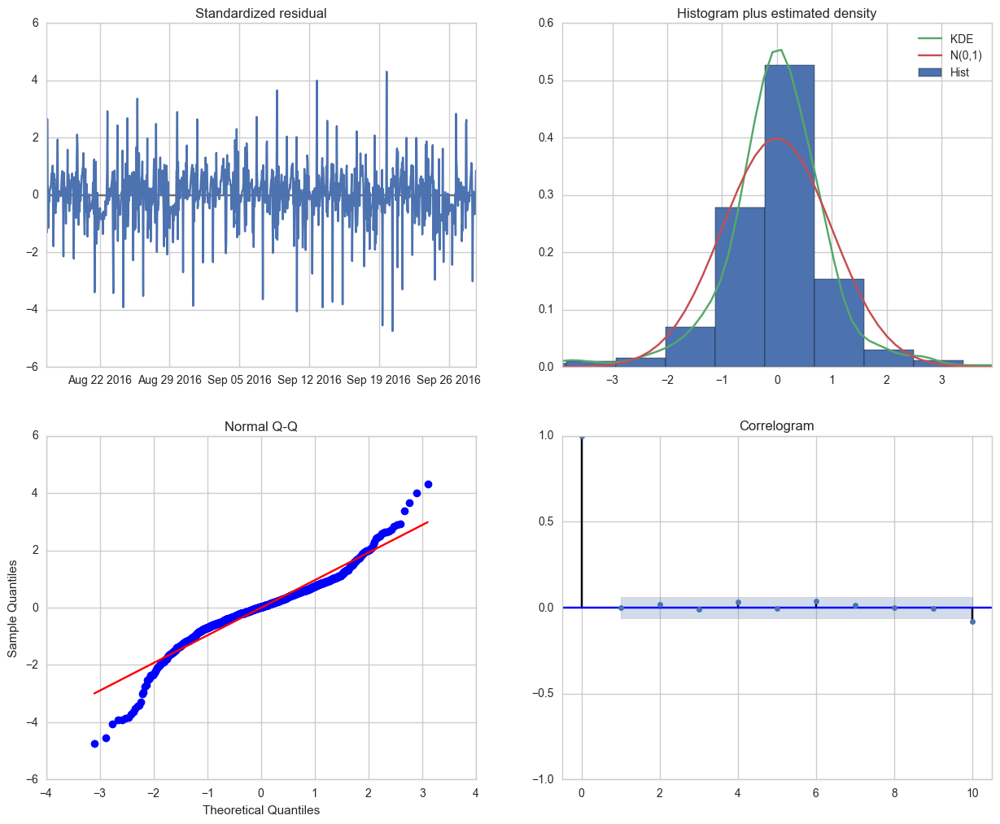

In [383]:
# Plot SARIMA diagnostics
results_SARIMAX.plot_diagnostics(figsize=(15, 12))
plt.show()

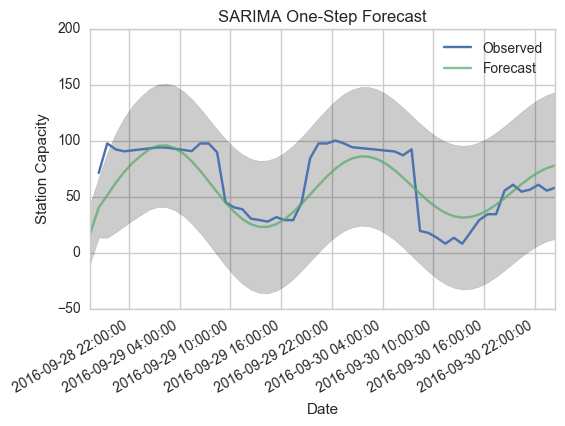

In [384]:
# Compare the forecast to the original data without a dynamic forecast
pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                      end=X_test.index[-1],
                                      dynamic=False)
pred_ci = pred.conf_int()

ax = plt.gca()
xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
ax.xaxis.set_major_formatter(xfmt)

ax = X_test.plot(label='Observed')
pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Station Capacity')
plt.title('SARIMA One-Step Forecast')
plt.legend()

plt.show()

In [385]:
# Extract the predicted and true values of our time series
y_forecasted = pred.predicted_mean
y_truth = X_test

# Compute the mean squared error
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('RMSE: {:.2f}'.format(mse**0.5))

The Mean Squared Error of our forecasts is 362.89
RMSE: 19.05


<a id='othermethods'></a>  
# Try other methods on station 31116  
Below we take a look at taking average percent capacity values over different time periods to determine whether there are other ways of forecasting the target variable.  
[Back to Top](#top)

### Group by all 24 hours individually and take average capacity

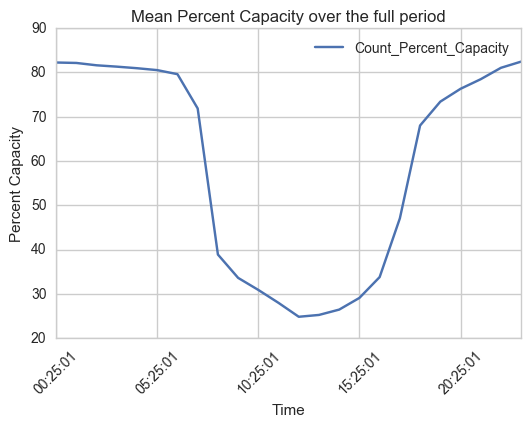

In [393]:
# Create the station 31116 dataframe
X = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == 31116]
X.drop('Station_Number', axis=1, inplace=True)

# Transform the dataframe and groupby Date to take the mean
mean_test = X.copy()
mean_test['Date'] = mean_test['Date'].apply(lambda x: str(x).split()[1])
mean_test = mean_test.groupby('Date').mean()

# Plot the dataframe
mean_test.plot()
plt.xticks(rotation=45)
plt.ylabel('Percent Capacity')
plt.xlabel('Time')
plt.title('Mean Percent Capacity over the full period');

### Group by season and 24 hours individually and take average capacity

In [396]:
# spring 3/1 to 5/31
# summer 6/1 to 8/31
# fall 9/1 to 11/30
# winter 12/1 to 2/28 (or 2/29 in leap year)
season_test = X.copy()
season_test['Season'] = ''
for row in season_test.itertuples():
    if row[2] >= pd.to_datetime('2015-7/01 00:00:00') and row[2] <= pd.to_datetime('2015-8/31 23:59:59'):
        season_test.set_value(row[0], 'Season', 'summer')
    if row[2] >= pd.to_datetime('2015-9/01 00:00:00') and row[2] <= pd.to_datetime('2015-11/30 23:59:59'):
        season_test.set_value(row[0], 'Season', 'fall')
    if row[2] >= pd.to_datetime('2015-12/01 00:00:00') and row[2] <= pd.to_datetime('2016-2/29 23:59:59'):
        season_test.set_value(row[0], 'Season', 'winter')
    if row[2] >= pd.to_datetime('2016-3/01 00:00:00') and row[2] <= pd.to_datetime('2016-5/31 23:59:59'):
        season_test.set_value(row[0], 'Season', 'spring')
    if row[2] >= pd.to_datetime('2016-6/01 00:00:00') and row[2] <= pd.to_datetime('2016-8/31 23:59:59'):
        season_test.set_value(row[0], 'Season', 'summer')
    if row[2] >= pd.to_datetime('2016-9/01 00:00:00') and row[2] <= pd.to_datetime('2016-11/30 23:59:59'):
        season_test.set_value(row[0], 'Season', 'fall')        

season_test.head()

,Count_Percent_Capacity,Date,Season
0,2.631579,2015-07-01 08:25:01,summer
1,2.631579,2015-07-01 09:25:01,summer
2,2.631579,2015-07-01 10:25:01,summer
3,1.315789,2015-07-01 11:25:01,summer
4,2.631579,2015-07-01 12:25:01,summer


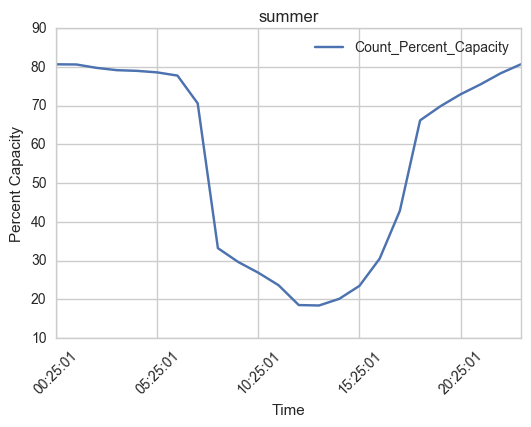

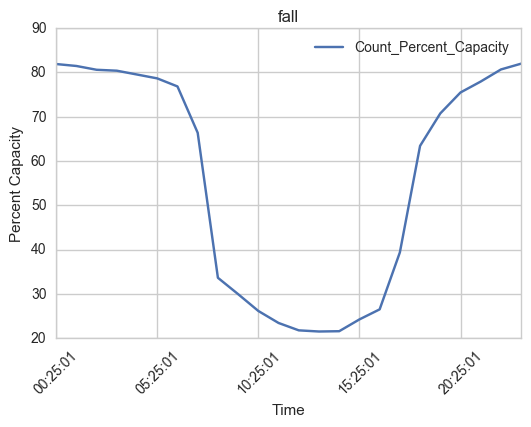

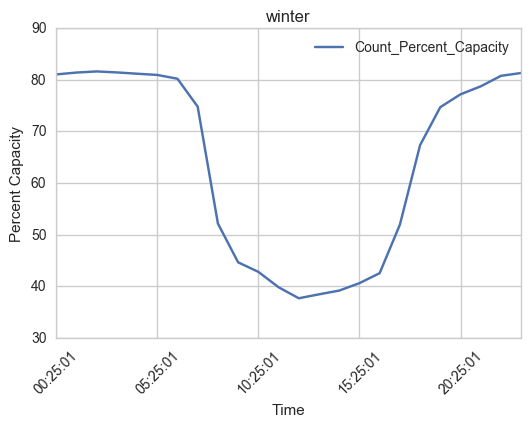

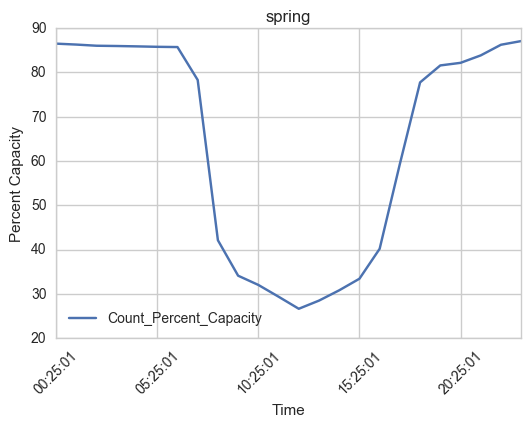

In [397]:
season_test['Date'] = season_test['Date'].apply(lambda x: str(x).split()[1])
for season in list(season_test['Season'].unique()):
    df = season_test[season_test['Season'] == season]
    df = df.groupby('Date').mean()
    df.plot()
    plt.title(season)
    plt.xlabel('Time')
    plt.xticks(rotation=45)
    plt.ylabel('Percent Capacity')
    plt.show();

<a id='generalforecast'></a>
# Generalize the SARIMA model
Taking the above findings and SARIMA model, I generalize to apply the model to each of the remaining 185 stations. I train on the last 9.5% for the data, and test on the last 0.5% of the data:  
[Back to Top](#top)

Station 31014
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


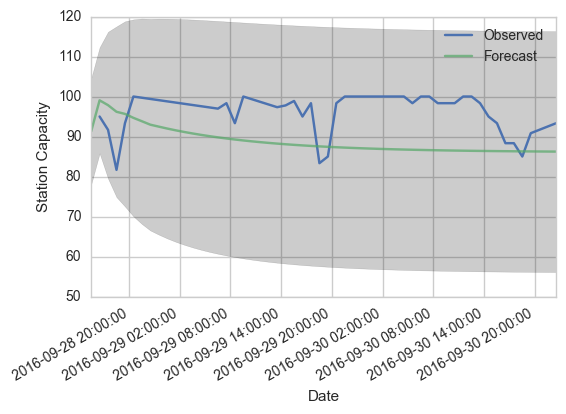

RMSE: 9.49


Station 31101
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


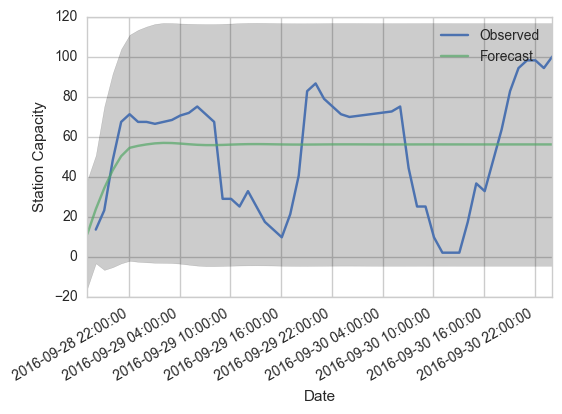

RMSE: 27.85


Station 31104
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


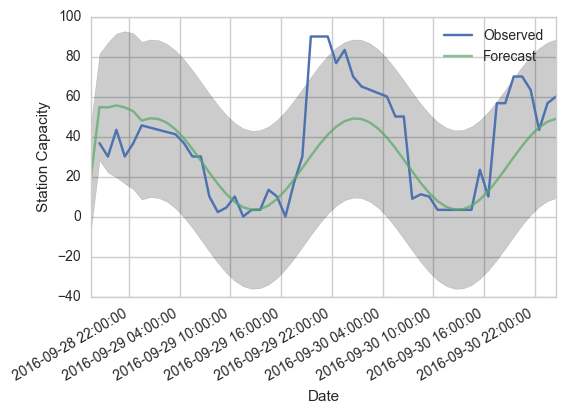

RMSE: 20.43


Station 31108
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


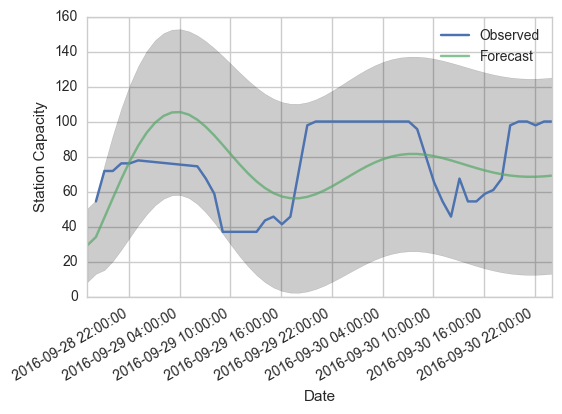

RMSE: 26.32


Station 31109
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


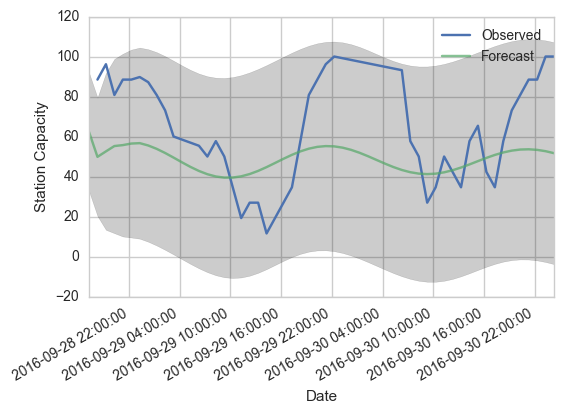

RMSE: 29.24


Station 31110
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


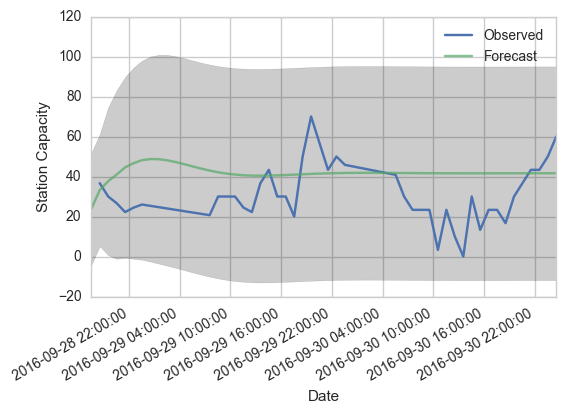

RMSE: 17.85


Station 31114
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


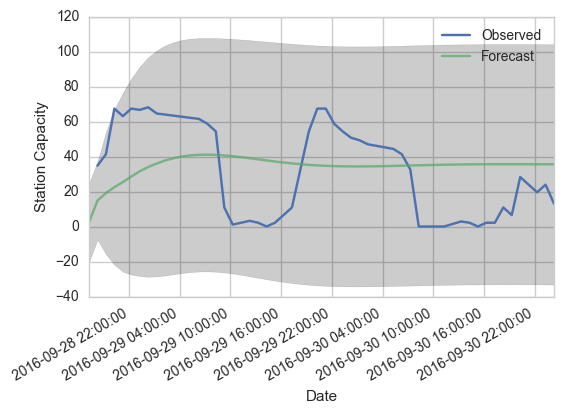

RMSE: 27.52


Station 31116
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


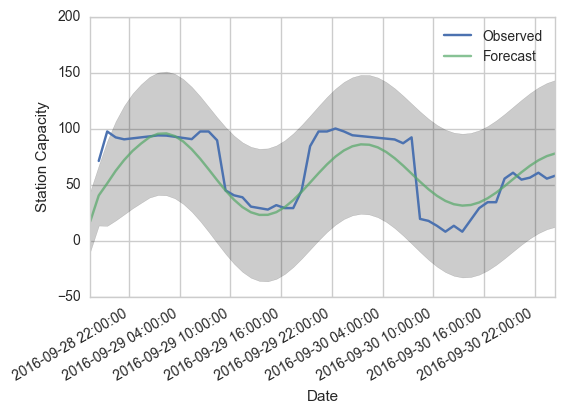

RMSE: 19.05


Station 31119
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


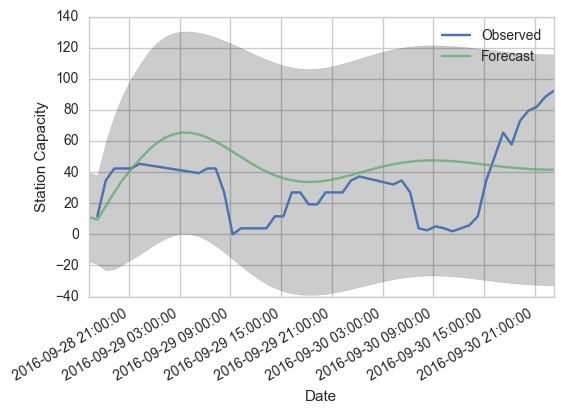

RMSE: 27.48


Station 31121
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


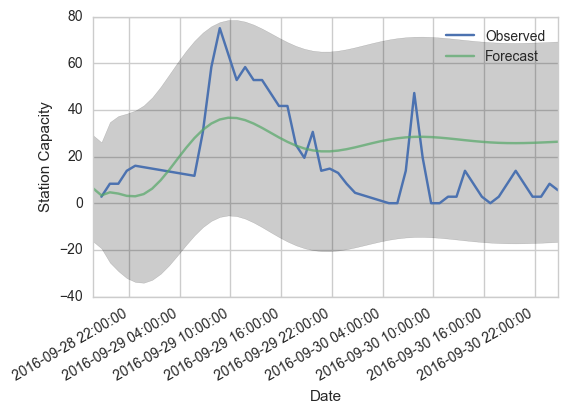

RMSE: 18.32


Station 31200
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



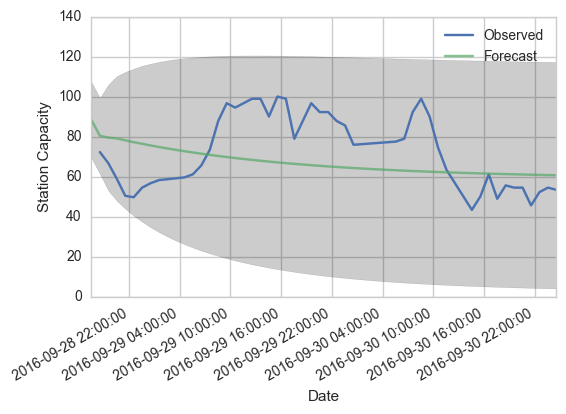

RMSE: 19.41


Station 31201
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


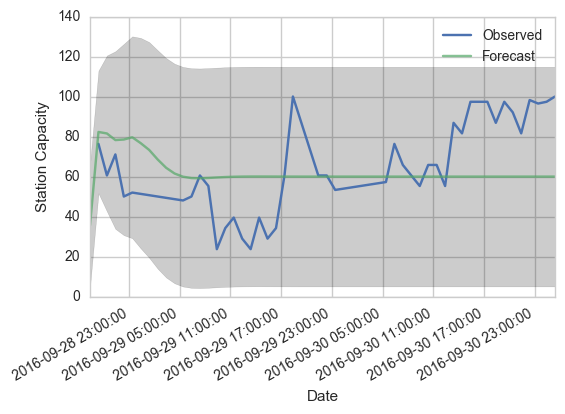

RMSE: 22.89


Station 31202
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



KeyboardInterrupt: 

In [434]:
rmse_dict = {}
for station in sorted(list(new_target_discrete_bike_data['Station_Number'].unique())):
    
    # Mask for station and transform to series object
    series_station = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    series_station.set_index('Date', inplace=True)
    series_station.drop('Station_Number', axis=1, inplace=True)
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):size], X[size:]

    model = SARIMAX(X_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(2, 0, 7),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Below I show the ACF and PACF plots for each of the remaining 66 stations:

Station 31014
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



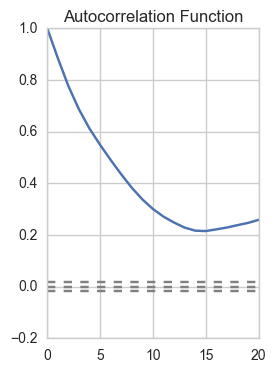

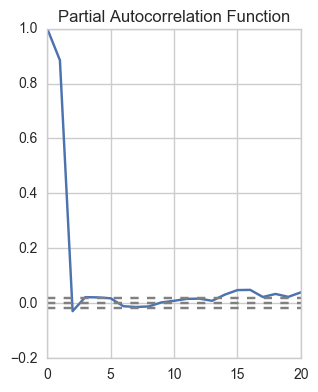

Station 31101
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



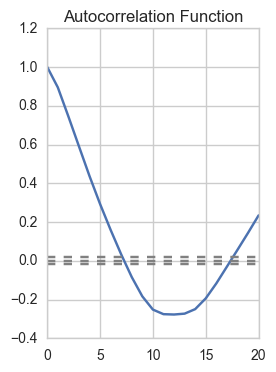

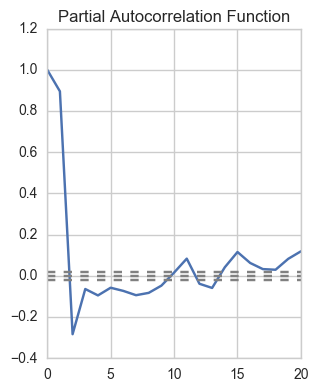

Station 31104
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



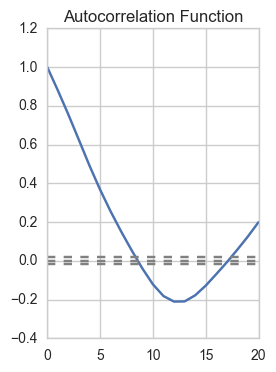

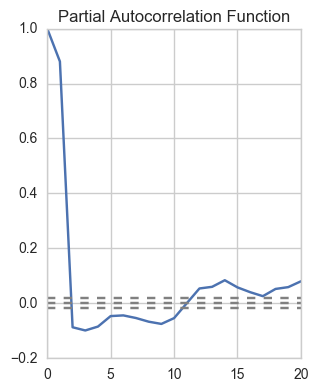

Station 31108
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



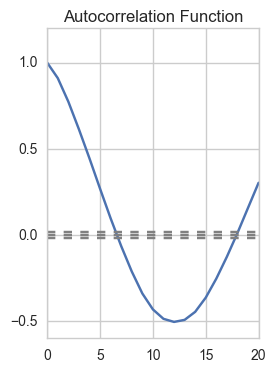

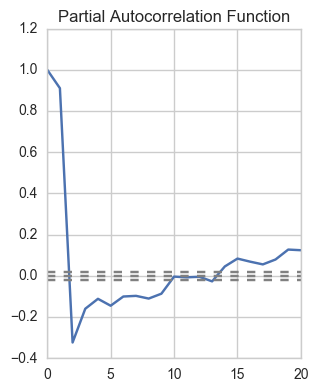

Station 31109
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



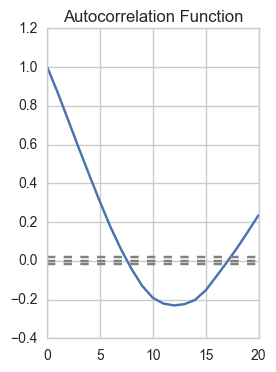

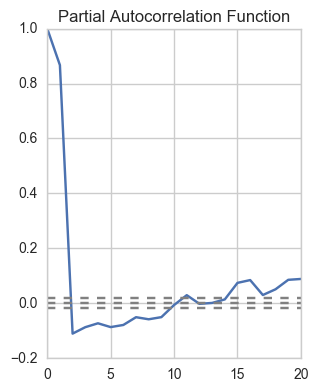

Station 31110
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



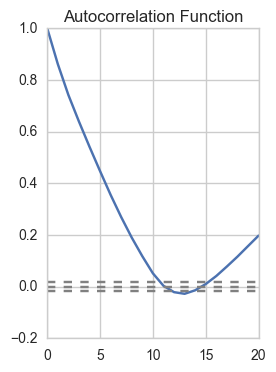

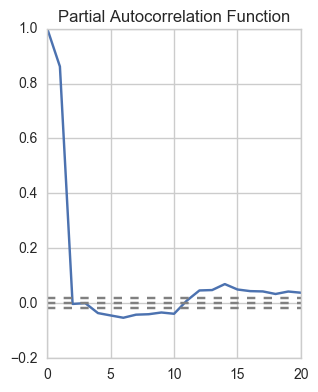

Station 31114
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



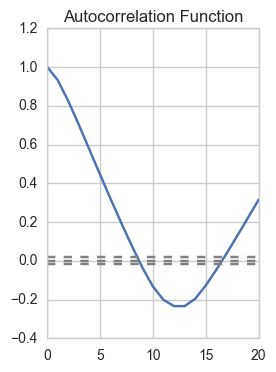

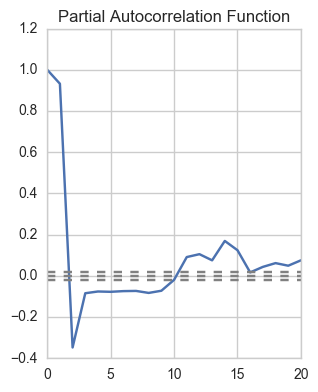

Station 31116
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



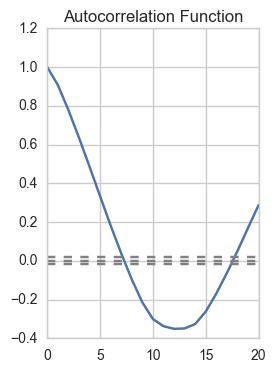

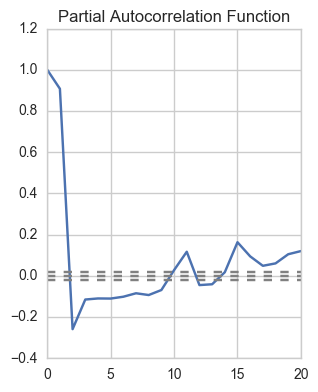

Station 31119
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



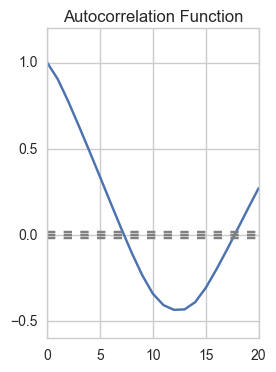

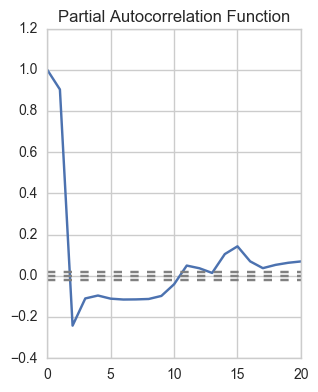

Station 31121
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



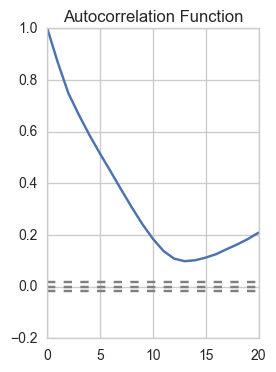

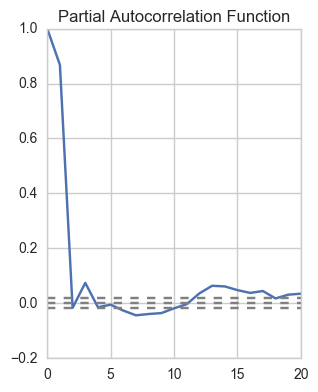

Station 31200
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



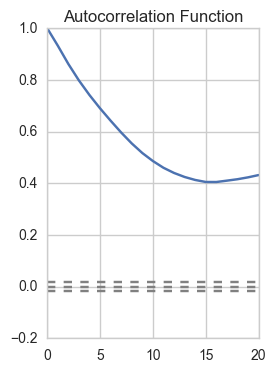

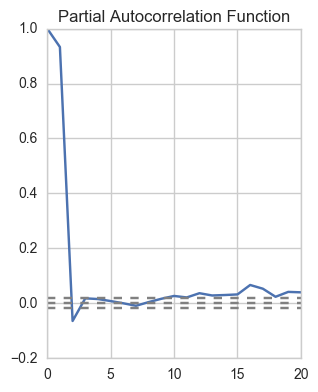

Station 31201
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



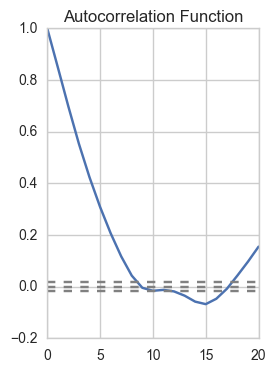

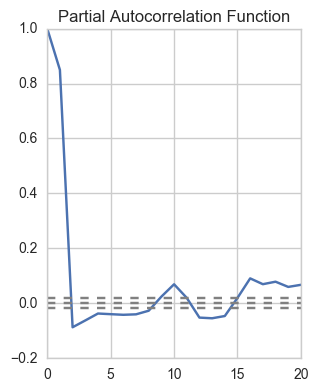

Station 31202
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



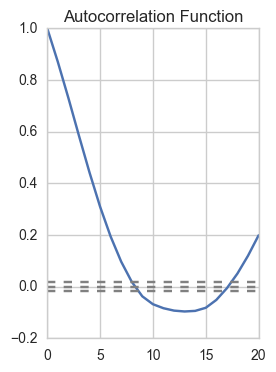

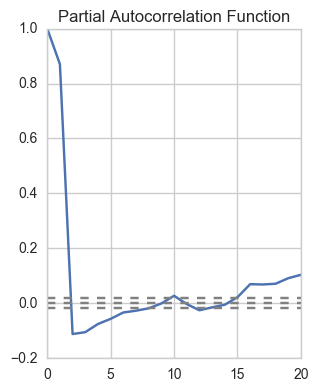

Station 31203
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



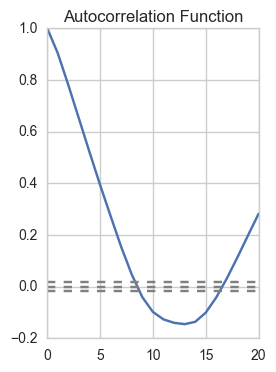

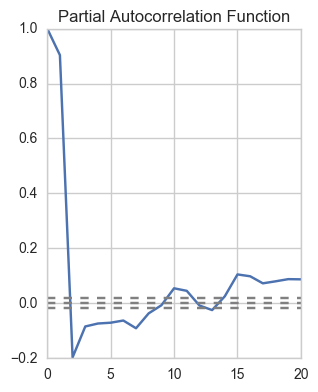

Station 31205
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



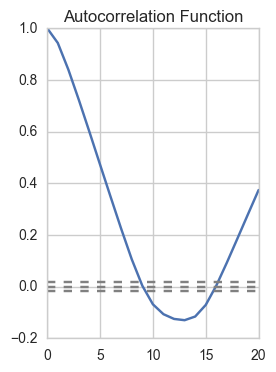

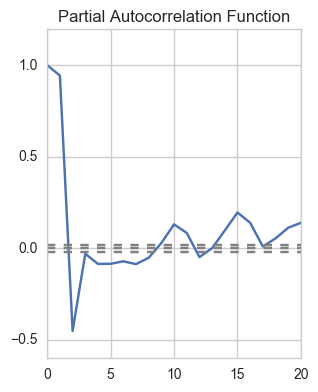

Station 31212
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



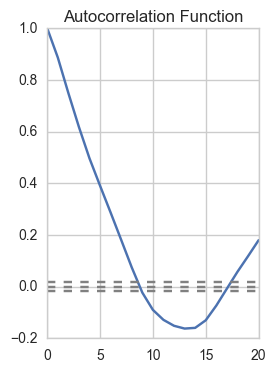

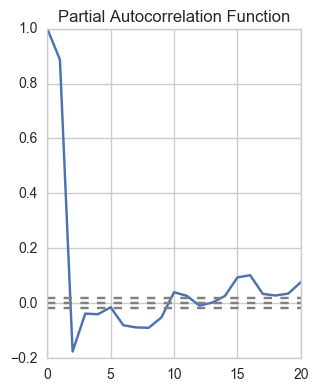

Station 31213
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



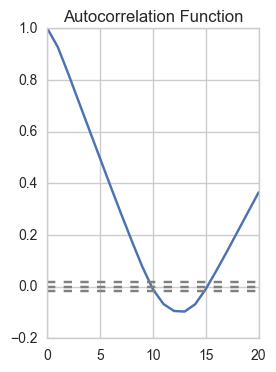

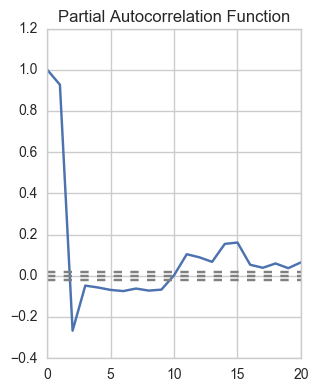

Station 31214
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



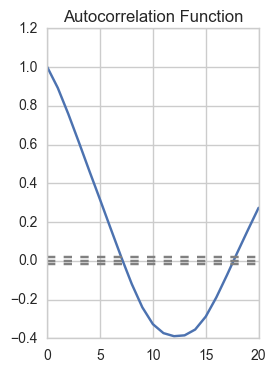

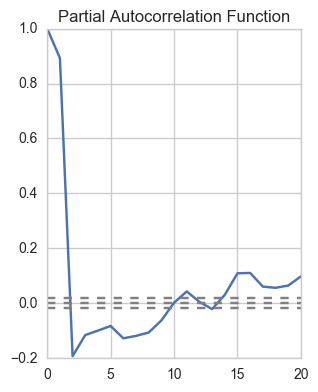

Station 31215
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



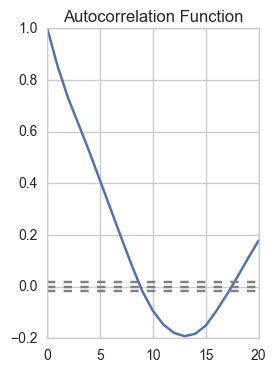

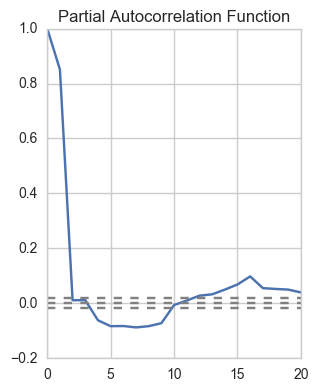

Station 31218
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



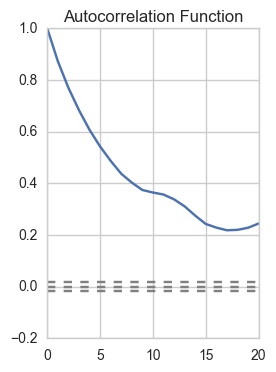

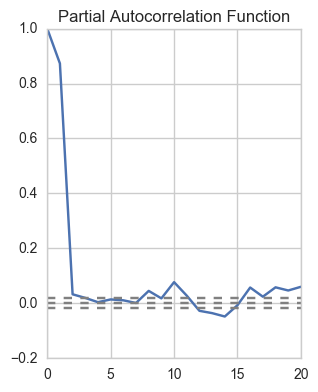

Station 31219
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



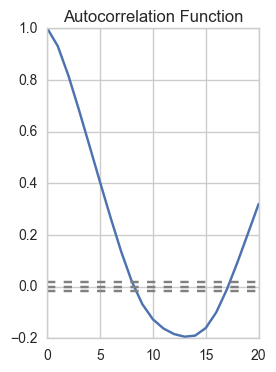

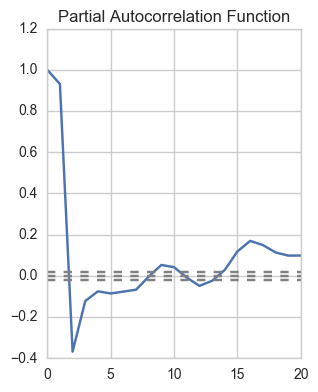

Station 31222
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



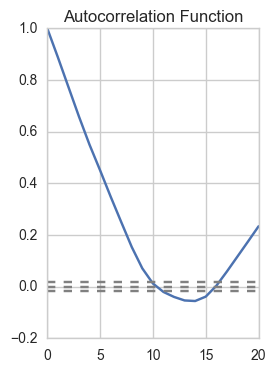

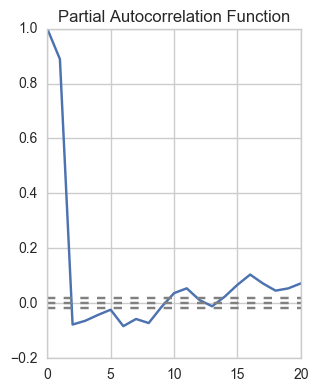

Station 31223
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



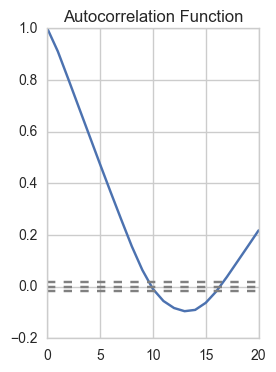

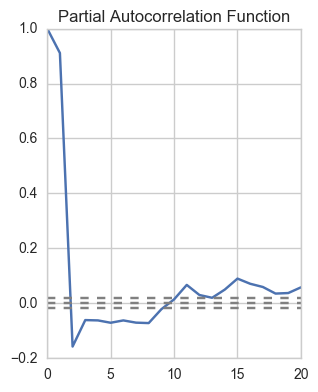

Station 31225
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



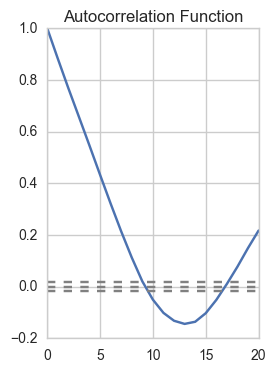

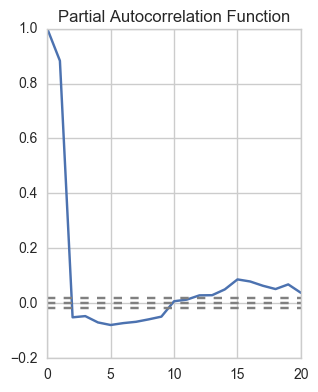

Station 31227
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



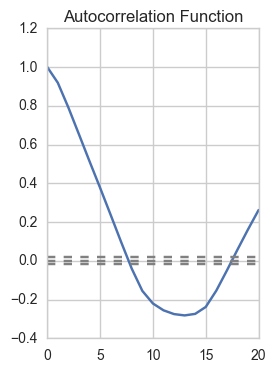

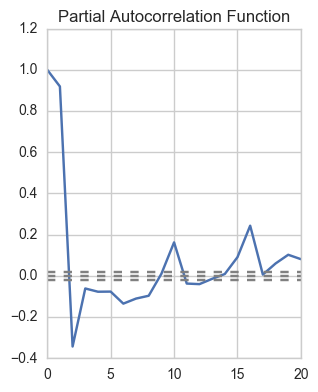

Station 31228
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



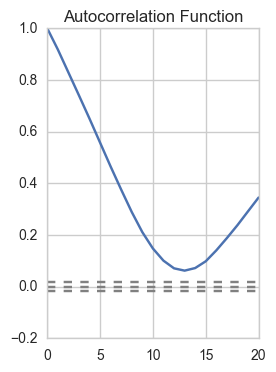

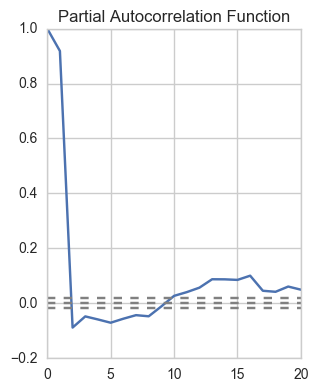

Station 31229
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



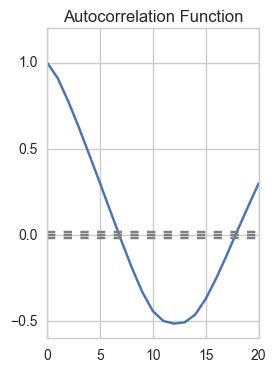

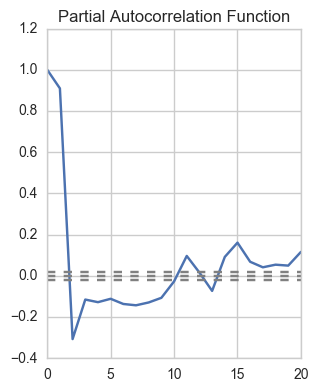

Station 31230
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



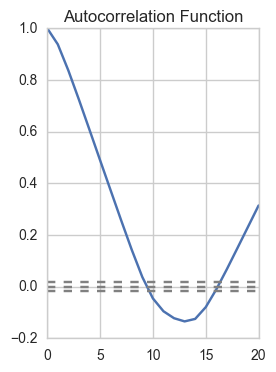

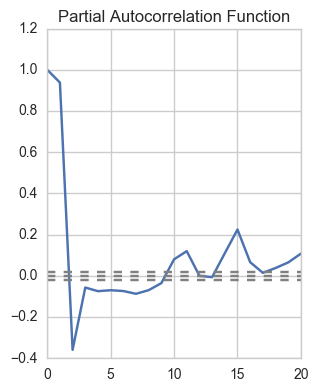

Station 31231
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



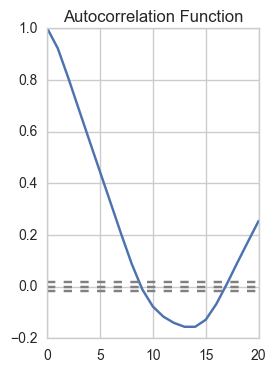

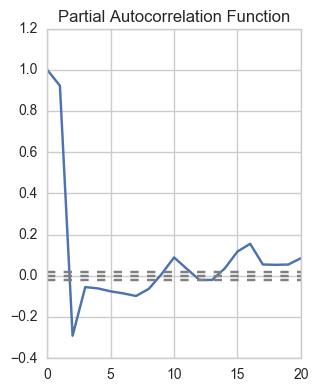

Station 31232
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



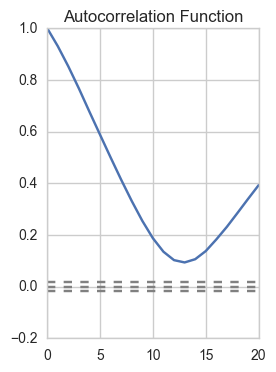

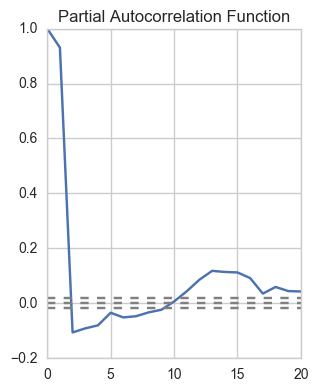

Station 31233
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



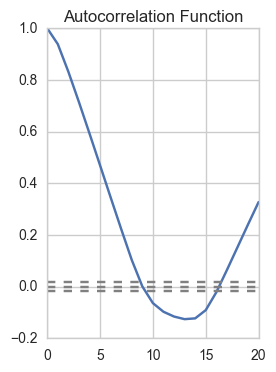

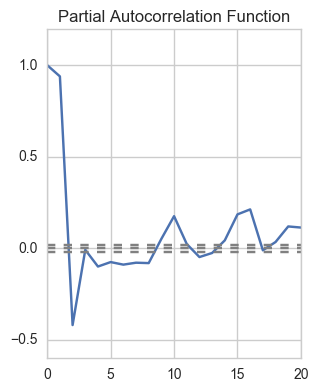

Station 31234
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



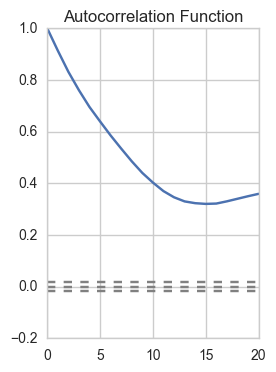

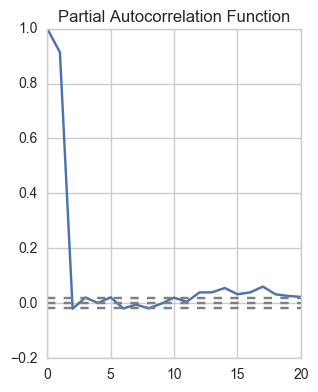

Station 31237
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



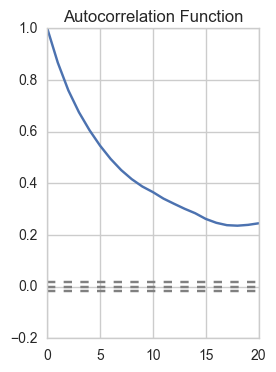

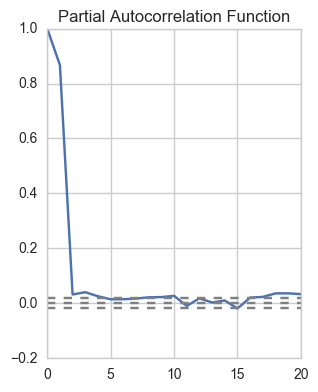

Station 31238
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



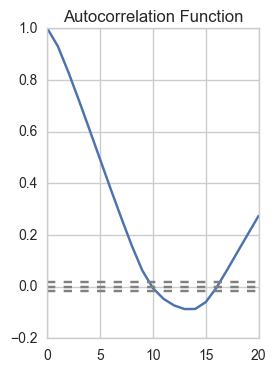

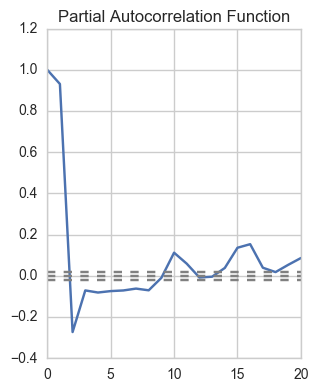

Station 31239
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



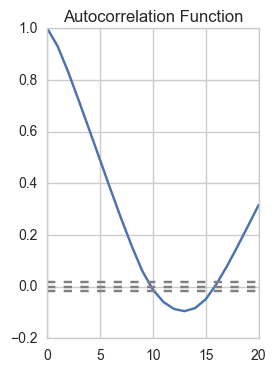

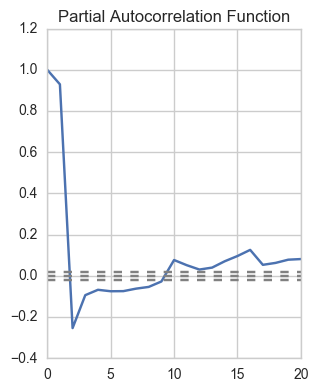

Station 31240
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



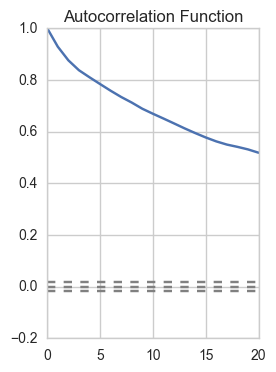

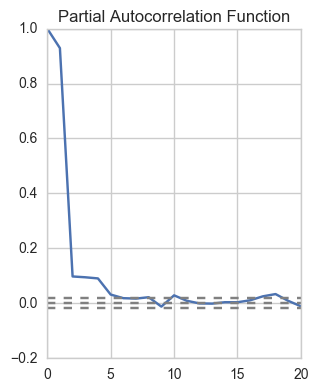

Station 31241
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



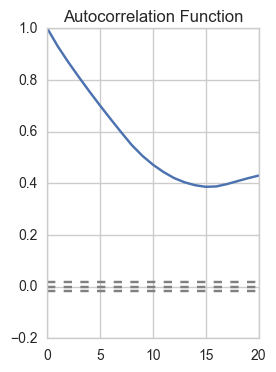

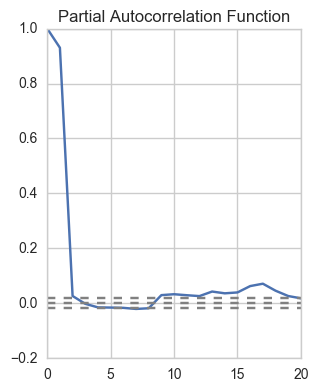

Station 31243
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



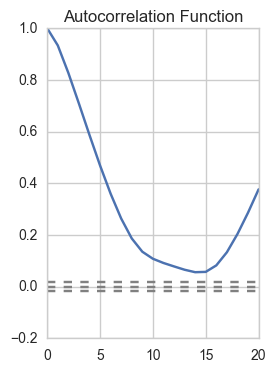

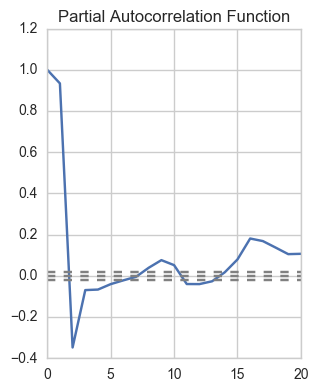

Station 31244
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



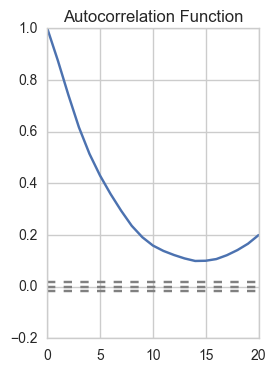

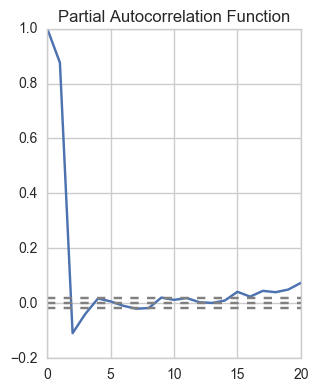

Station 31245
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



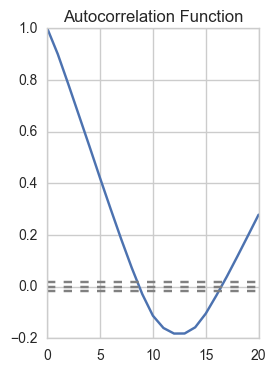

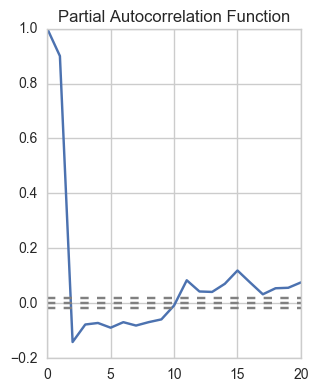

Station 31246
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



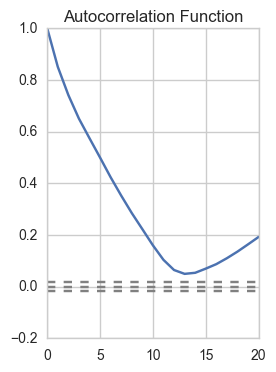

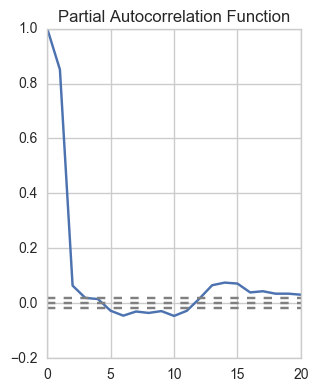

Station 31247
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



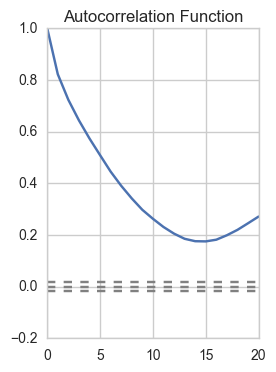

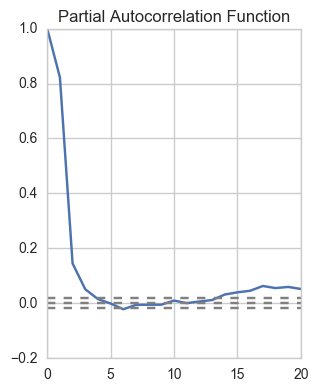

Station 31248
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



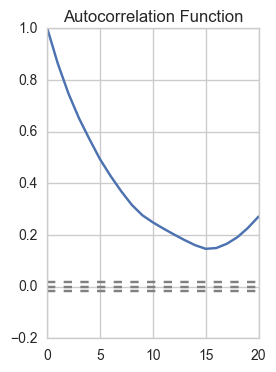

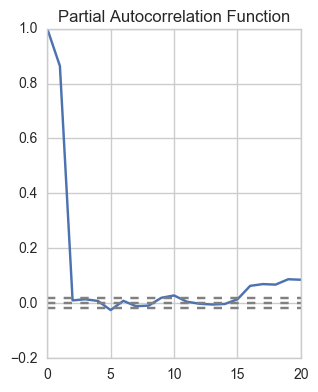

Station 31249
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



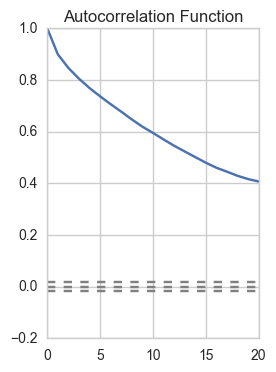

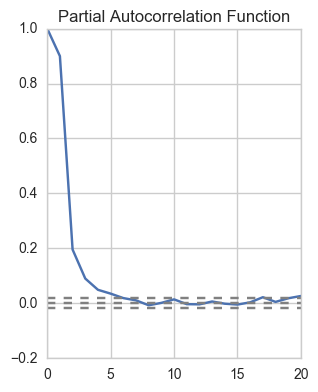

Station 31257
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



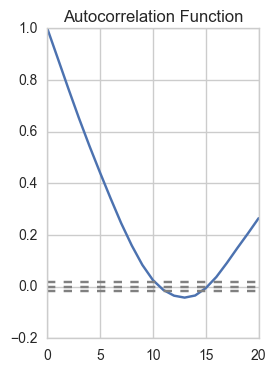

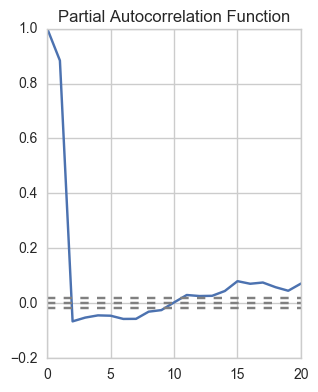

Station 31258
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



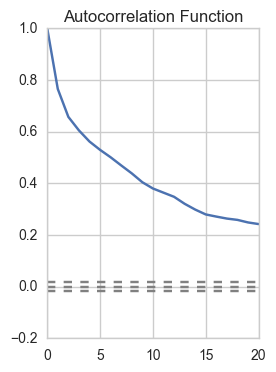

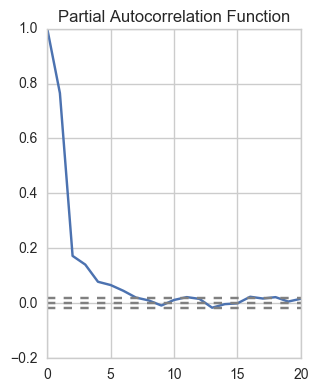

Station 31263
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



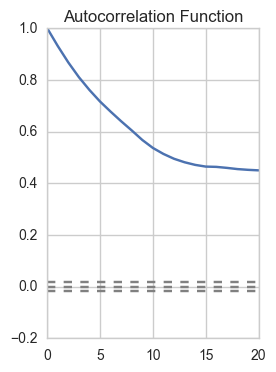

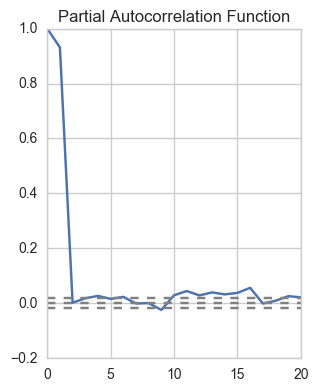

Station 31265
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



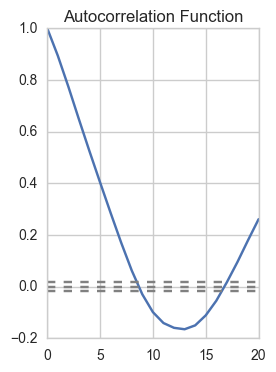

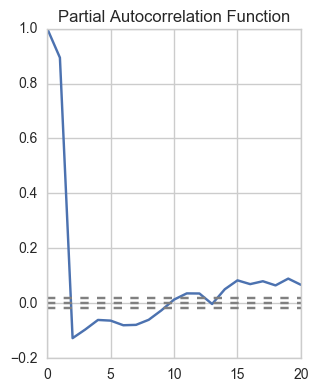

Station 31266
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



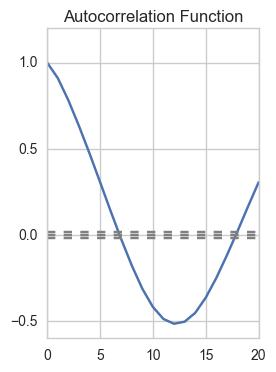

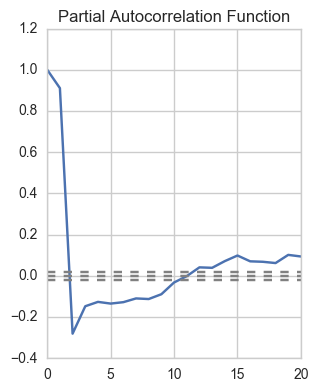

Station 31267
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



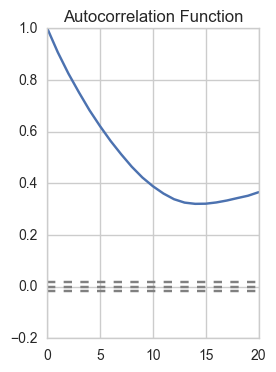

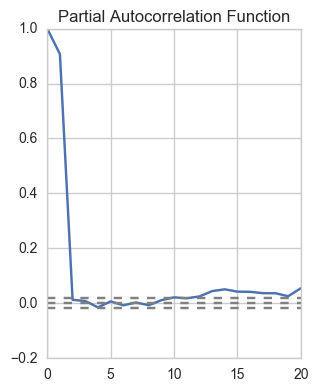

Station 31268
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



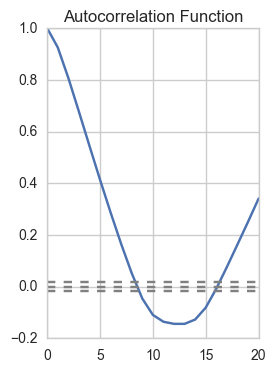

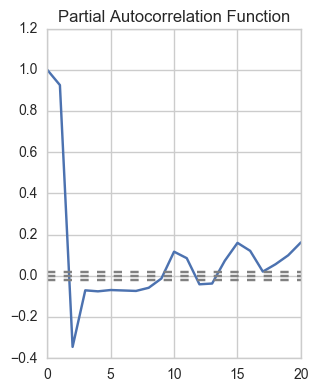

Station 31269
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



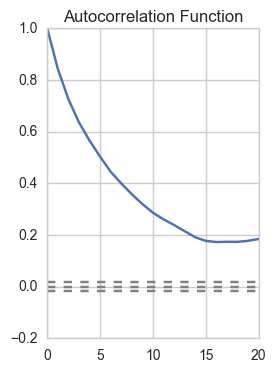

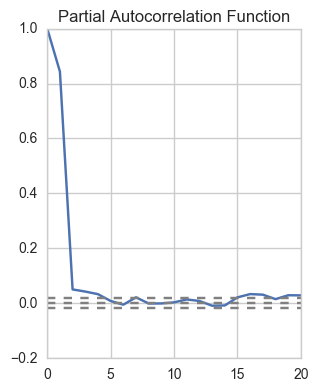

Station 31270
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



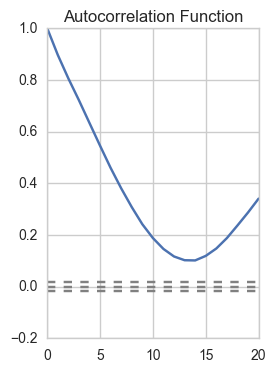

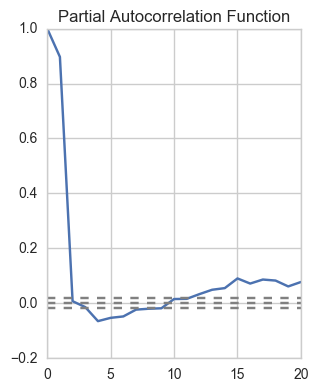

Station 31271
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



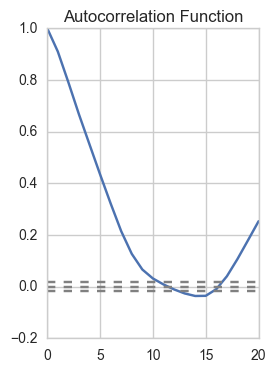

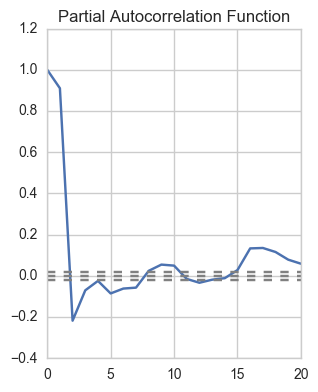

Station 31272
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



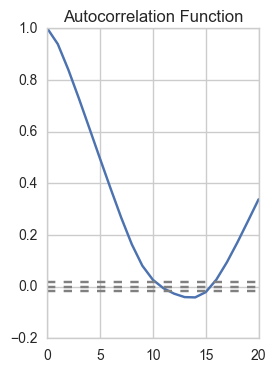

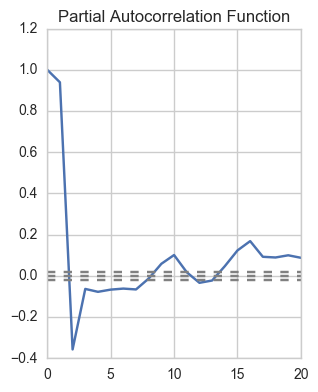

Station 31277
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



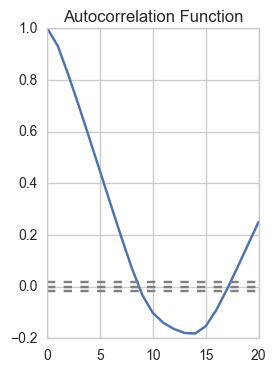

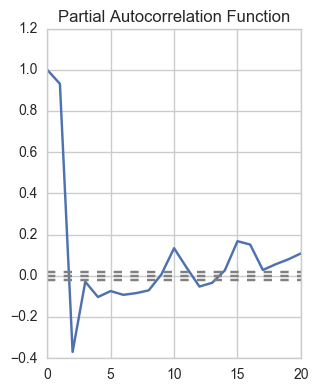

Station 31278
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



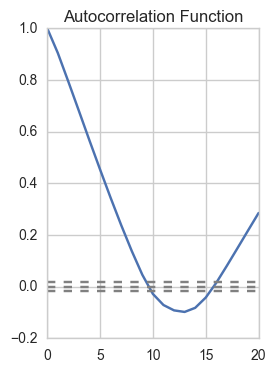

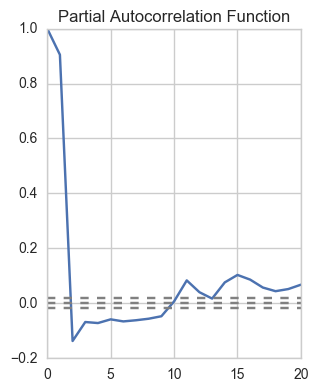

Station 31281
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



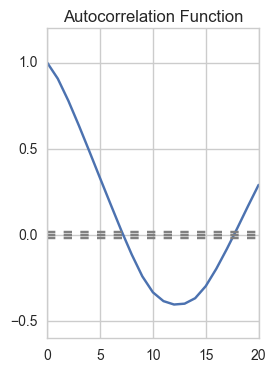

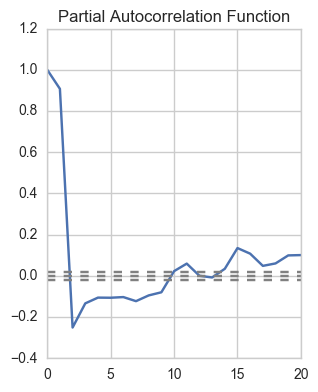

Station 31600
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



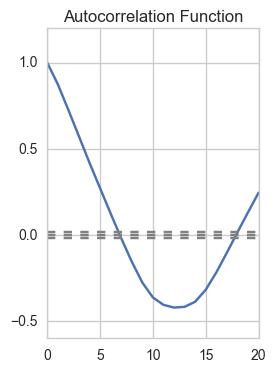

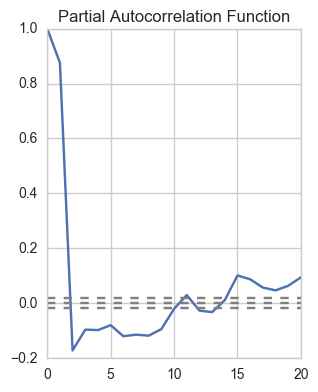

Station 31602
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



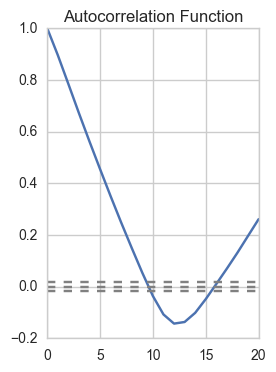

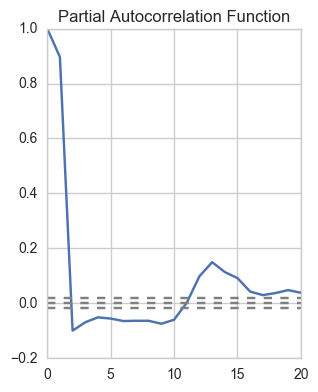

Station 31603
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



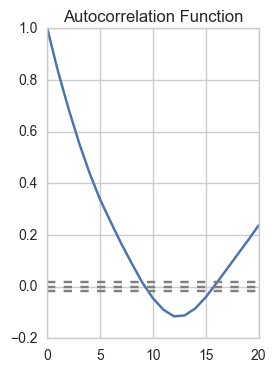

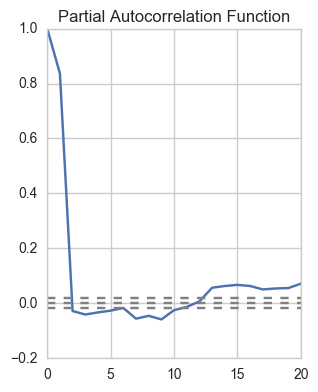

Station 31613
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



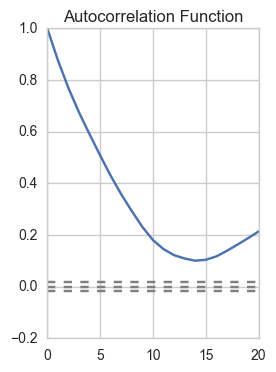

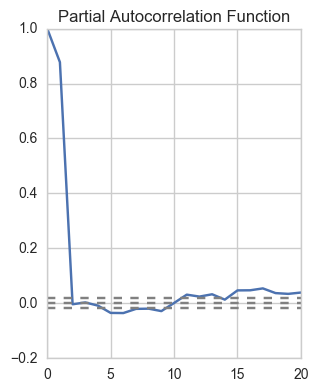

Station 31616
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



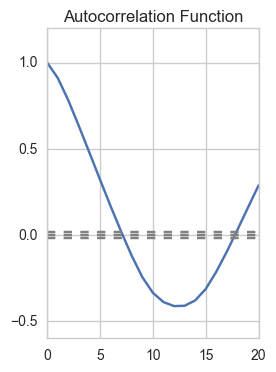

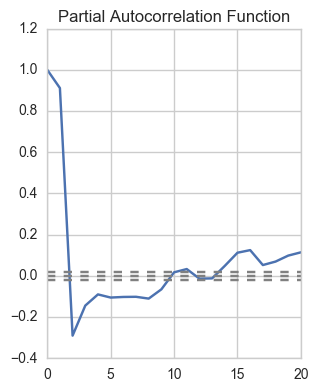

Station 31623
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



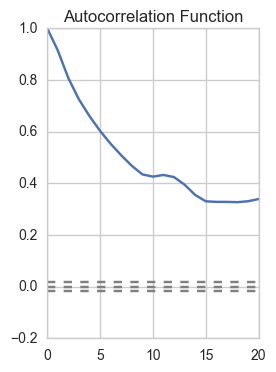

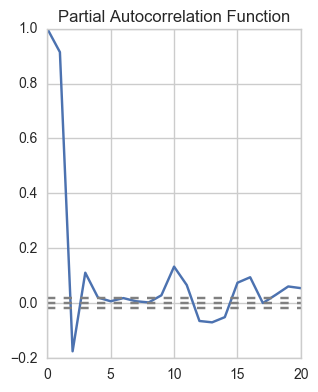

Station 31624
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



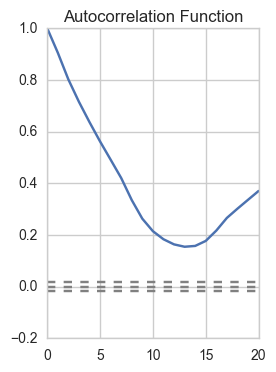

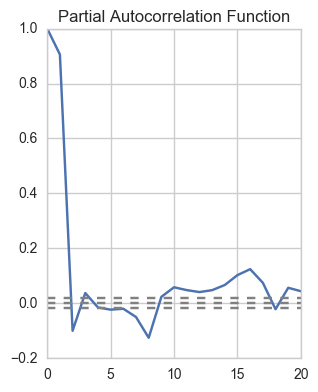

Station 31627
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



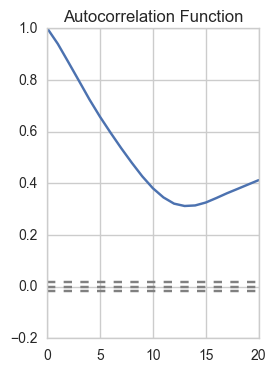

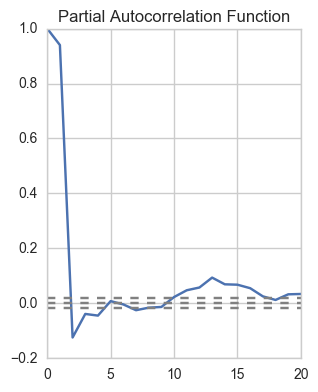

Station 31628
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



KeyboardInterrupt: 

In [416]:
for station in sorted(list(new_target_discrete_bike_data['Station_Number'].unique())):
    
    # Mask for station and transform to series object
    series_station = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    series_station.set_index('Date', inplace=True)
    series_station.drop('Station_Number', axis=1, inplace=True)
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
        
    
    # Create ACF and PACF plots as inputs to the ARIMA model
    # Plot ACF: 
    lag_acf = acf(series_station, nlags=20)
    plt.subplot(121) 
    plt.plot(lag_acf)
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(series_station)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(series_station)),linestyle='--',color='gray')
    plt.title('Autocorrelation Function')
    plt.show()
    # Plot PACF:
    lag_pacf = pacf(series_station, nlags=20, method='ols')
    plt.subplot(122)
    plt.plot(lag_pacf)
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(series_station)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(series_station)),linestyle='--',color='gray')
    plt.title('Partial Autocorrelation Function')
    plt.tight_layout()
    plt.show()